In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [3]:
df= pd.read_csv('/content/Walmart.csv')
df.head()

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,05-02-2010,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,12-02-2010,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,19-02-2010,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,26-02-2010,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,05-03-2010,1554806.68,0,46.50,2.625,211.350143,8.106


In [4]:
print(df.to_string())

      Store        Date  Weekly_Sales  Holiday_Flag  Temperature  Fuel_Price         CPI  Unemployment
0         1  05-02-2010    1643690.90             0        42.31       2.572  211.096358         8.106
1         1  12-02-2010    1641957.44             1        38.51       2.548  211.242170         8.106
2         1  19-02-2010    1611968.17             0        39.93       2.514  211.289143         8.106
3         1  26-02-2010    1409727.59             0        46.63       2.561  211.319643         8.106
4         1  05-03-2010    1554806.68             0        46.50       2.625  211.350143         8.106
5         1  12-03-2010    1439541.59             0        57.79       2.667  211.380643         8.106
6         1  19-03-2010    1472515.79             0        54.58       2.720  211.215635         8.106
7         1  26-03-2010    1404429.92             0        51.45       2.732  211.018042         8.106
8         1  02-04-2010    1594968.28             0        62.27       2.

In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   Store         6435 non-null   int64  
 1   Date          6435 non-null   object 
 2   Weekly_Sales  6435 non-null   float64
 3   Holiday_Flag  6435 non-null   int64  
 4   Temperature   6435 non-null   float64
 5   Fuel_Price    6435 non-null   float64
 6   CPI           6435 non-null   float64
 7   Unemployment  6435 non-null   float64
dtypes: float64(5), int64(2), object(1)
memory usage: 402.3+ KB


In [6]:
df.isnull().sum()

Store           0
Date            0
Weekly_Sales    0
Holiday_Flag    0
Temperature     0
Fuel_Price      0
CPI             0
Unemployment    0
dtype: int64

In [7]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Store,6435.0,2.300000e+01,12.988182,1.000,12.000,23.000000,3.400000e+01,4.500000e+01
Weekly_Sales,6435.0,1.046965e+06,564366.622054,209986.250,553350.105,960746.040000,1.420159e+06,3.818686e+06
Holiday_Flag,6435.0,6.993007e-02,0.255049,0.000,0.000,0.000000,0.000000e+00,1.000000e+00
Temperature,6435.0,6.066378e+01,18.444933,-2.060,47.460,62.670000,7.494000e+01,1.001400e+02
Fuel_Price,6435.0,3.358607e+00,0.459020,2.472,2.933,3.445000,3.735000e+00,4.468000e+00
CPI,6435.0,1.715784e+02,39.356712,126.064,131.735,182.616521,2.127433e+02,2.272328e+02
Unemployment,6435.0,7.999151e+00,1.875885,3.879,6.891,7.874000,8.622000e+00,1.431300e+01


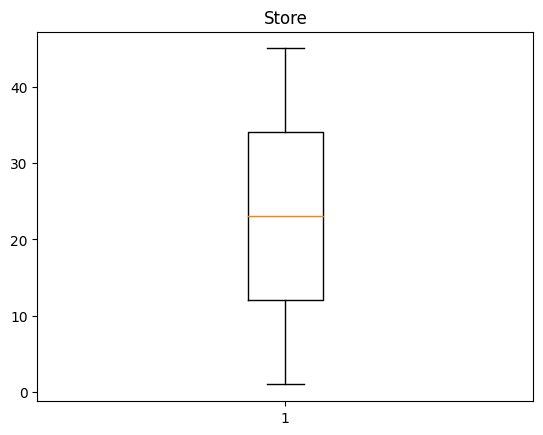

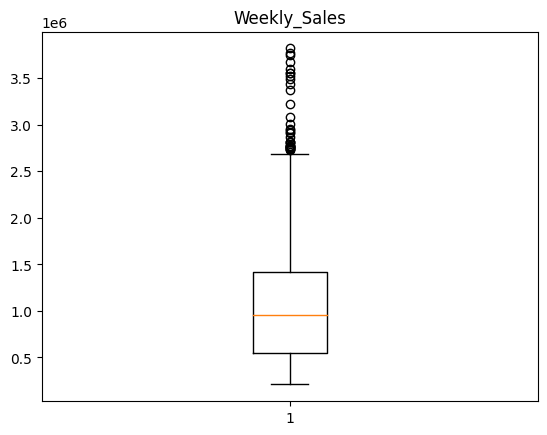

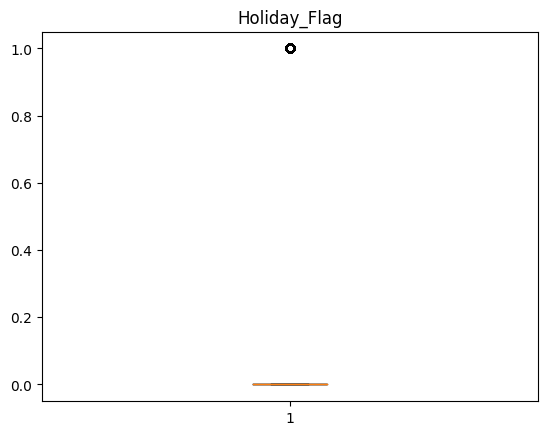

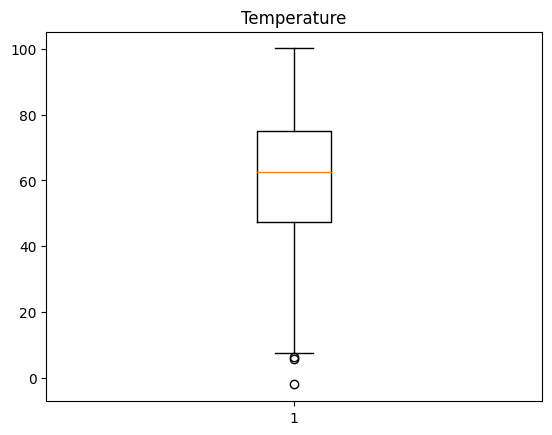

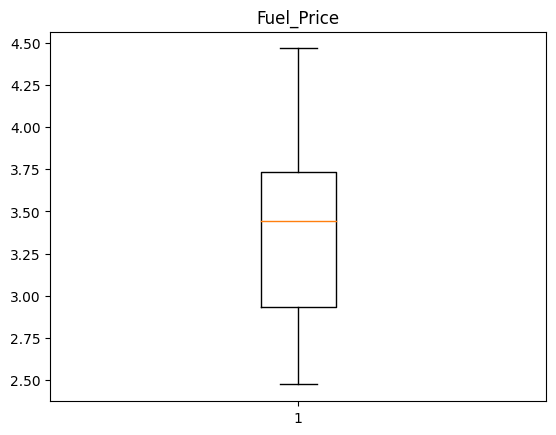

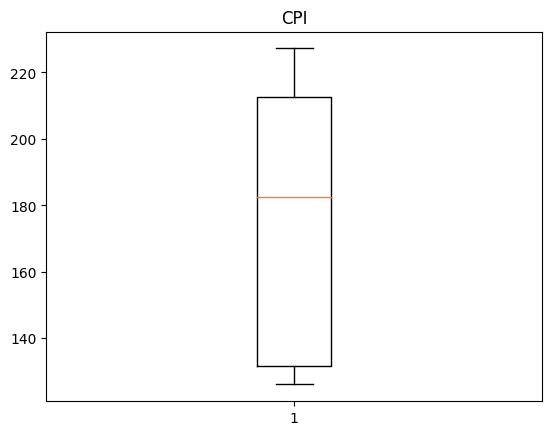

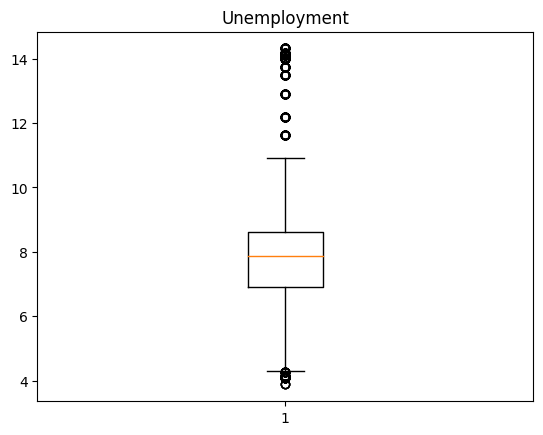

In [8]:
for col in df.columns:
  if df[col].dtype!='object':
    plt.boxplot(df[col])
    plt.title(col)
    plt.show()

In [9]:
# If the weekly sales are affected by the unemployment rate, if yes - which stores are suffering the most?
df_grouped = df.groupby('Store')['Weekly_Sales','Unemployment'].corr()

# Find stores with the highest negative correlation between weekly sales and unemployment rate
suffering_stores = df_grouped[df_grouped['Unemployment'] < 0].sort_values(by='Unemployment', ascending=True)

print("Stores suffering the most from high unemployment:")
print(suffering_stores.head())

Stores suffering the most from high unemployment:
                    Weekly_Sales  Unemployment
Store                                         
38    Weekly_Sales           1.0     -0.785290
44    Weekly_Sales           1.0     -0.780076
39    Weekly_Sales           1.0     -0.384681
42    Weekly_Sales           1.0     -0.356355
41    Weekly_Sales           1.0     -0.350630


<ipython-input-9-fc7f9682f00a>:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df_grouped = df.groupby('Store')['Weekly_Sales','Unemployment'].corr()


<ipython-input-10-5622cbc96551>:2: UserWarning: Parsing dates in DD/MM/YYYY format when dayfirst=False (the default) was specified. This may lead to inconsistently parsed dates! Specify a format to ensure consistent parsing.
  df['Date'] = pd.to_datetime(df['Date'])


<Axes: xlabel='Date'>

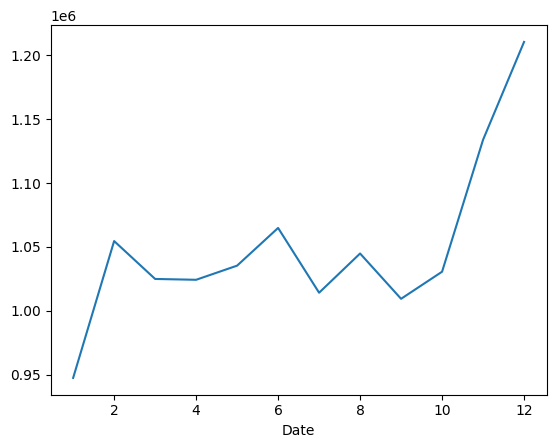

In [10]:
# If the weekly sales show a seasonal trend, when and what could be the reason
df['Date'] = pd.to_datetime(df['Date'])
monthly_sales = df.groupby(df['Date'].dt.month)['Weekly_Sales'].mean()
monthly_sales.plot()
# if the plot shows a clear upward or downward trend, then there is a seasonal trend
# the highest point of the trend indicates

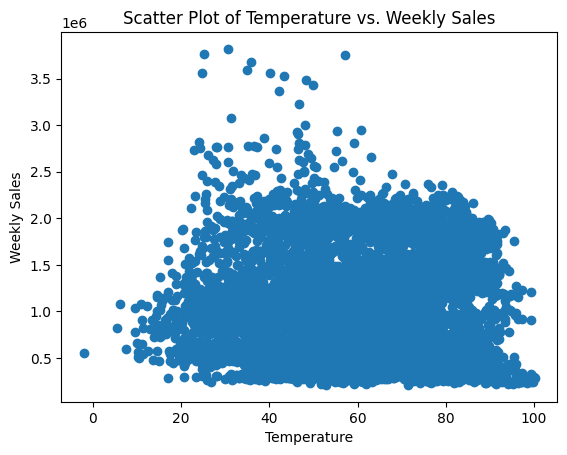

Correlation coefficient: -0.06381001317946955


In [11]:
#Does temperature affect the weekly sales in any manner?
plt.scatter(df["Temperature"], df["Weekly_Sales"])
plt.xlabel("Temperature")
plt.ylabel("Weekly Sales")
plt.title("Scatter Plot of Temperature vs. Weekly Sales")
plt.show()

correlation = df["Temperature"].corr(df["Weekly_Sales"])
print(f"Correlation coefficient: {correlation}")

In [12]:
df.head(5)

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-05-02,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,2010-12-02,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,2010-05-03,1554806.68,0,46.50,2.625,211.350143,8.106


In [13]:
#How is the Consumer Price index affecting the weekly sales of various stores?
df.groupby(by='Store')['Weekly_Sales','CPI'].corr()
#df.groupby(['Store', 'CPI'])['Weekly_Sales'].mean()

<ipython-input-13-6da84a59a371>:2: FutureWarning: Indexing with multiple keys (implicitly converted to a tuple of keys) will be deprecated, use a list instead.
  df.groupby(by='Store')['Weekly_Sales','CPI'].corr()


Weekly_Sales       CPI
Store                                     
1     Weekly_Sales      1.000000  0.225408
      CPI               0.225408  1.000000
2     Weekly_Sales      1.000000 -0.062431
      CPI              -0.062431  1.000000
3     Weekly_Sales      1.000000  0.317250
...                          ...       ...
43    CPI              -0.285686  1.000000
44    Weekly_Sales      1.000000  0.740150
      CPI               0.740150  1.000000
45    Weekly_Sales      1.000000 -0.023548
      CPI              -0.023548  1.000000

[90 rows x 2 columns]

In [14]:
#Top performing stores according to the historical data
store_perf = df.groupby('Store')['Weekly_Sales'].mean().sort_values(ascending=False).reset_index()
store_perf.head(5)

,Store,Weekly_Sales
0,20,2.107677e+06
1,4,2.094713e+06
2,14,2.020978e+06
3,13,2.003620e+06
4,2,1.925751e+06


In [15]:
#The worst performing store, and how significant is the difference between the highest and lowest performing stores
worst_store = df.groupby('Store')['Weekly_Sales'].mean().sort_values(ascending=True).index[0]
best_store = df.groupby('Store')['Weekly_Sales'].mean().sort_values(ascending=False).index[0]
difference = df.groupby('Store')['Weekly_Sales'].mean().sort_values(ascending=False).iloc[0] - df.groupby('Store')['Weekly_Sales'].mean().sort_values(ascending=True).iloc[0]
print(f'Worst performing store: {worst_store}')
print(f'Difference between highest and lowest Performing Stores: {difference}')

Worst performing store: 33
Difference between highest and lowest Performing Stores: 1847815.1783216782


In [16]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6435 entries, 0 to 6434
Data columns (total 8 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   Store         6435 non-null   int64         
 1   Date          6435 non-null   datetime64[ns]
 2   Weekly_Sales  6435 non-null   float64       
 3   Holiday_Flag  6435 non-null   int64         
 4   Temperature   6435 non-null   float64       
 5   Fuel_Price    6435 non-null   float64       
 6   CPI           6435 non-null   float64       
 7   Unemployment  6435 non-null   float64       
dtypes: datetime64[ns](1), float64(5), int64(2)
memory usage: 402.3 KB


In [17]:
!pip install prophet

In [18]:
from prophet import Prophet

In [19]:
df

,Store,Date,Weekly_Sales,Holiday_Flag,Temperature,Fuel_Price,CPI,Unemployment
0,1,2010-05-02,1643690.90,0,42.31,2.572,211.096358,8.106
1,1,2010-12-02,1641957.44,1,38.51,2.548,211.242170,8.106
2,1,2010-02-19,1611968.17,0,39.93,2.514,211.289143,8.106
3,1,2010-02-26,1409727.59,0,46.63,2.561,211.319643,8.106
4,1,2010-05-03,1554806.68,0,46.50,2.625,211.350143,8.106
...,...,...,...,...,...,...,...,...
6430,45,2012-09-28,713173.95,0,64.88,3.997,192.013558,8.684
6431,45,2012-05-10,733455.07,0,64.89,3.985,192.170412,8.667
6432,45,2012-12-10,734464.36,0,54.47,4.000,192.327265,8.667
6433,45,2012-10-19,718125.53,0,56.47,3.969,192.330854,8.667


In [20]:
store_1 =df[df['Store']==1]
store_1 = store_1.drop(store_1.columns.difference(['Date', 'Weekly_Sales']), 1)
store_1.rename(columns={'Date': 'ds', 'Weekly_Sales': 'y'}, inplace=True)
store_1

<ipython-input-20-fe775f5c1379>:2: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  store_1 = store_1.drop(store_1.columns.difference(['Date', 'Weekly_Sales']), 1)


,ds,y
0,2010-05-02,1643690.90
1,2010-12-02,1641957.44
2,2010-02-19,1611968.17
3,2010-02-26,1409727.59
4,2010-05-03,1554806.68
...,...,...
138,2012-09-28,1437059.26
139,2012-05-10,1670785.97
140,2012-12-10,1573072.81
141,2012-10-19,1508068.77


In [21]:
model1 = Prophet(interval_width=0.95)
model1.fit(store_1)

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/i_m86gve.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/etgbnali.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=48170', 'data', 'file=/tmp/tmptwuzpm09/i_m86gve.json', 'init=/tmp/tmptwuzpm09/etgbnali.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelu9d247m3/prophet_model-20240327053506.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:35:06 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:35:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


In [22]:
future = model1.make_future_dataframe(periods=12, freq='M')
forecast = model1.predict(future)

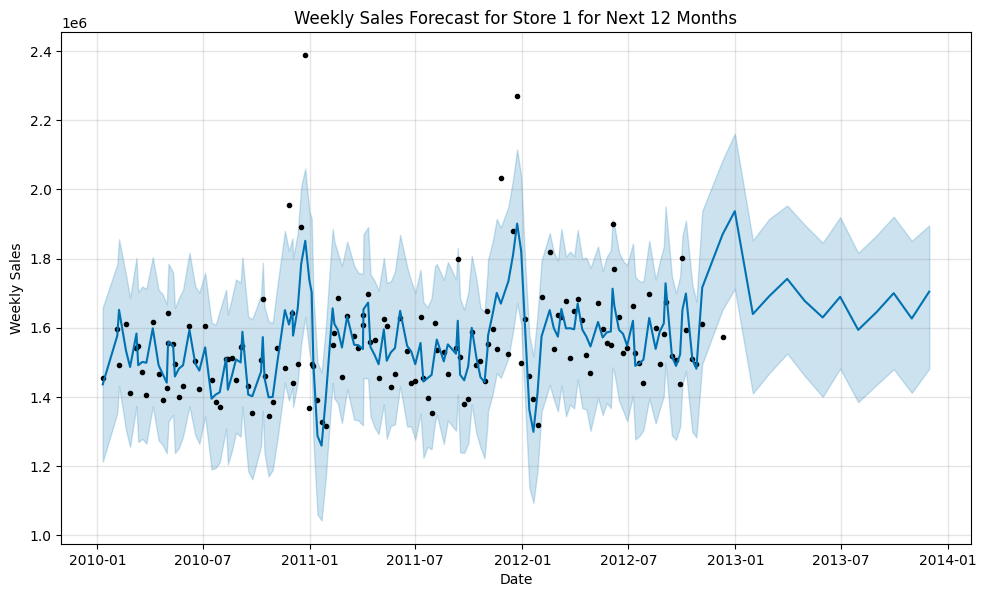

In [23]:
model1.plot(forecast)
plt.xlabel('Date')
plt.ylabel('Weekly Sales')
plt.title('Weekly Sales Forecast for Store 1 for Next 12 Months')
plt.show()

In [39]:
walmart_df = df.drop(df.columns.difference(['Store','Date', 'Weekly_Sales']), 1)

<ipython-input-39-3d8d7ee79103>:1: FutureWarning: In a future version of pandas all arguments of DataFrame.drop except for the argument 'labels' will be keyword-only.
  walmart_df = df.drop(df.columns.difference(['Store','Date', 'Weekly_Sales']), 1)


In [40]:
walmart_df

,Store,Date,Weekly_Sales
0,1,2010-05-02,1643690.90
1,1,2010-12-02,1641957.44
2,1,2010-02-19,1611968.17
3,1,2010-02-26,1409727.59
4,1,2010-05-03,1554806.68
...,...,...,...
6430,45,2012-09-28,713173.95
6431,45,2012-05-10,733455.07
6432,45,2012-12-10,734464.36
6433,45,2012-10-19,718125.53


In [41]:
def forecast_store(store_data):
    store_data.rename(columns={'Date': 'ds', 'Weekly_Sales': 'y'}, inplace=True)
    model = Prophet(interval_width=0.95)
    model.fit(store_data)
    future = model.make_future_dataframe(periods=12, freq='W')
    forecast = model.predict(future)
    return forecast

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/l93nme2x.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/h6yqwm5j.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=45460', 'data', 'file=/tmp/tmptwuzpm09/l93nme2x.json', 'init=/tmp/tmptwuzpm09/h6yqwm5j.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelk1_z5r7y/prophet_model-20240327055612.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


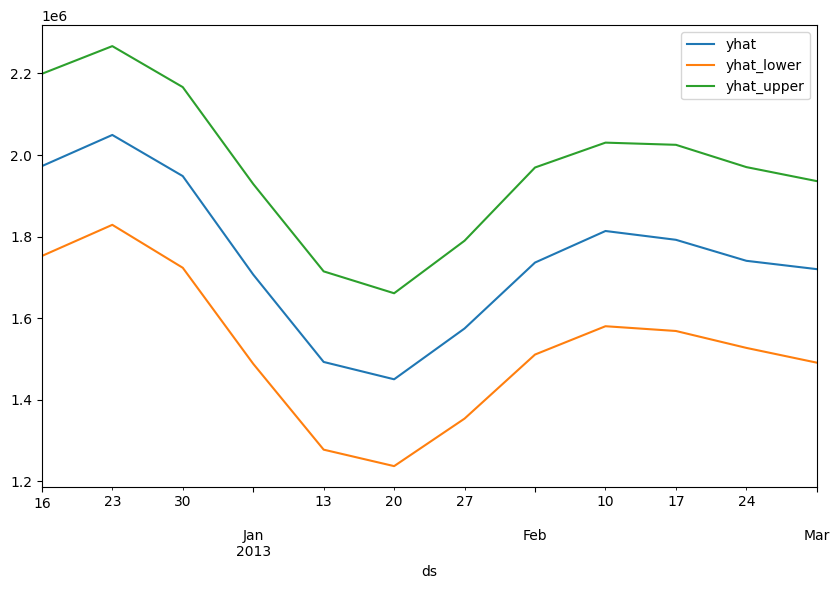

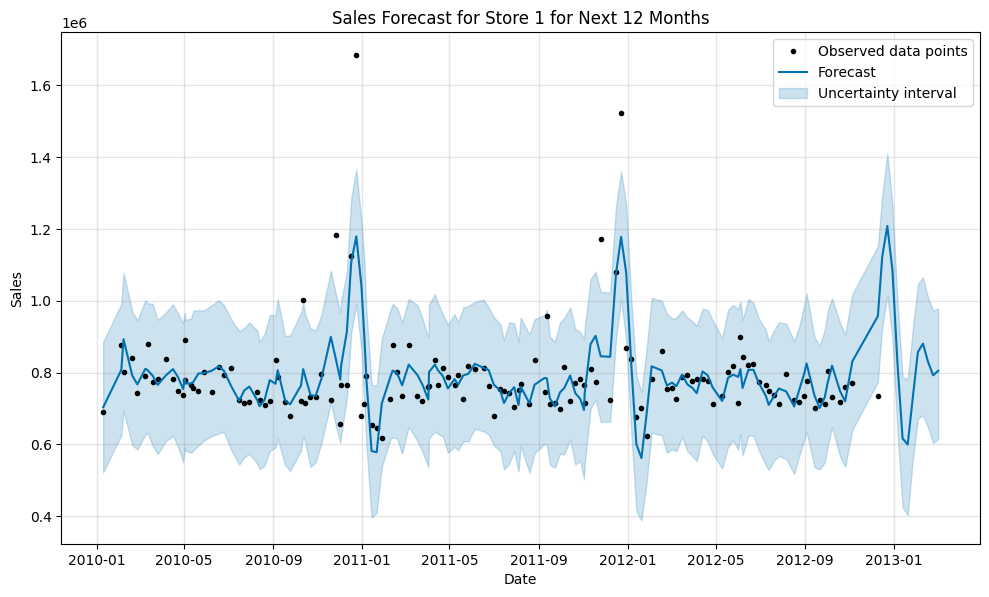

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/d8u0w1to.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/kso5ny_w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=23473', 'data', 'file=/tmp/tmptwuzpm09/d8u0w1to.json', 'init=/tmp/tmptwuzpm09/kso5ny_w.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_model9nueqw3t/prophet_model-20240327055613.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:13 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:13 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


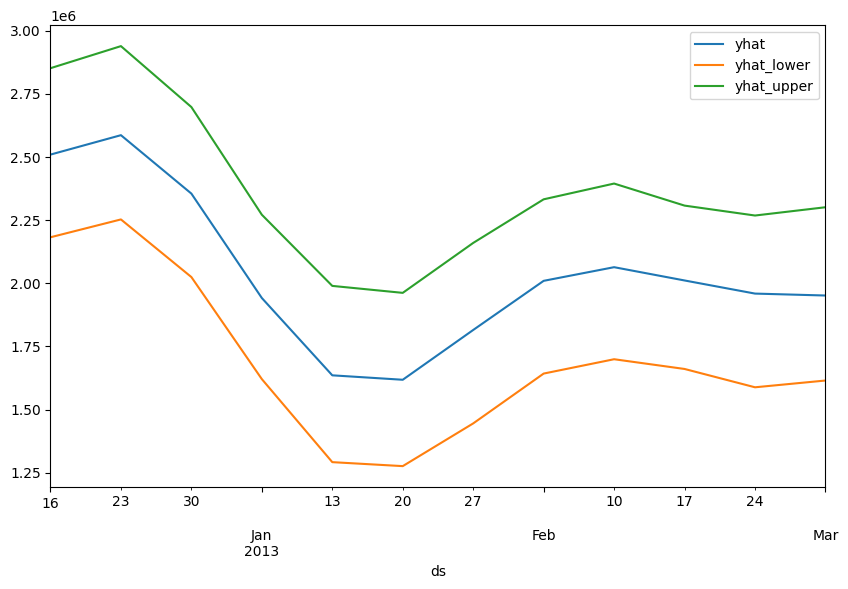

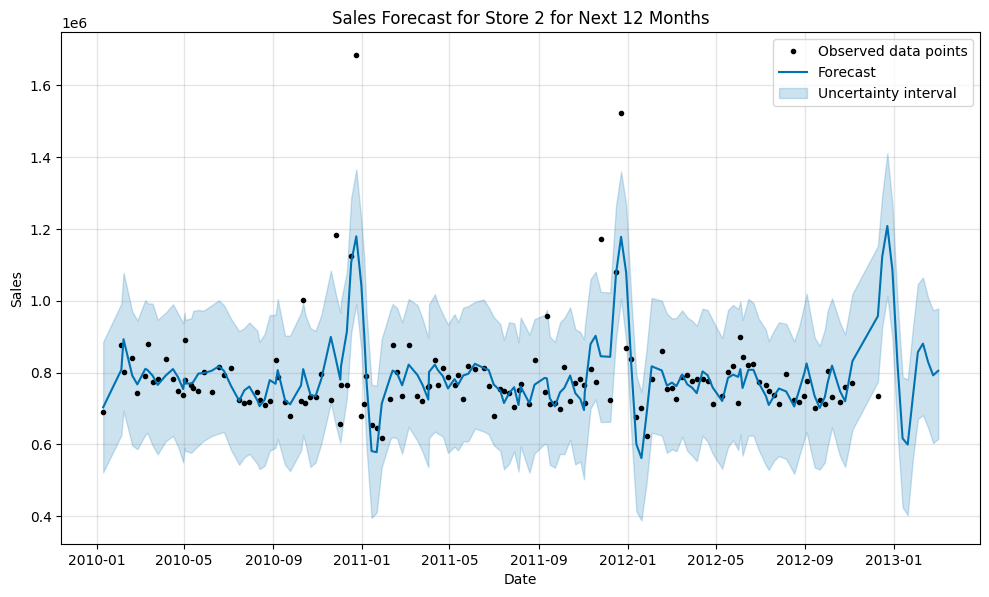

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/ph1zu28f.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/xzjz4z2c.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=5339', 'data', 'file=/tmp/tmptwuzpm09/ph1zu28f.json', 'init=/tmp/tmptwuzpm09/xzjz4z2c.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelw_891txd/prophet_model-20240327055614.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:14 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


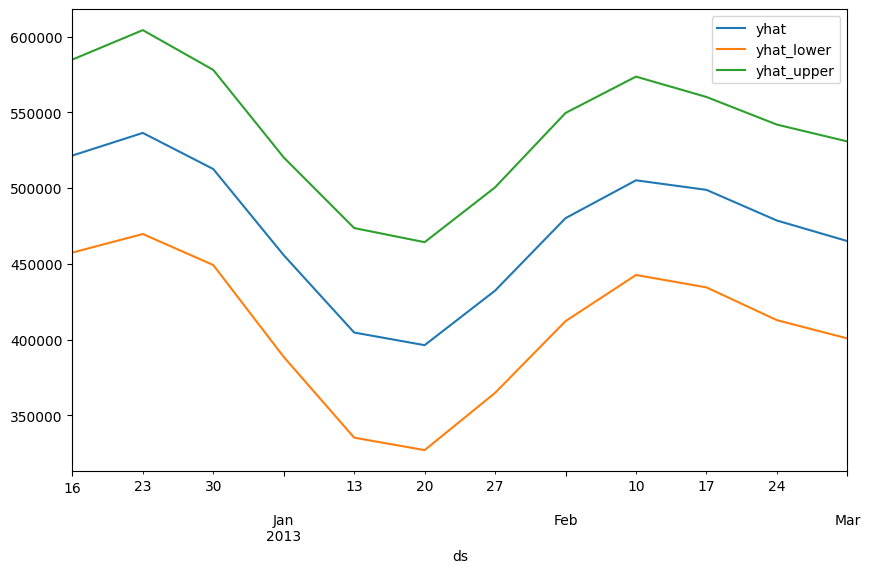

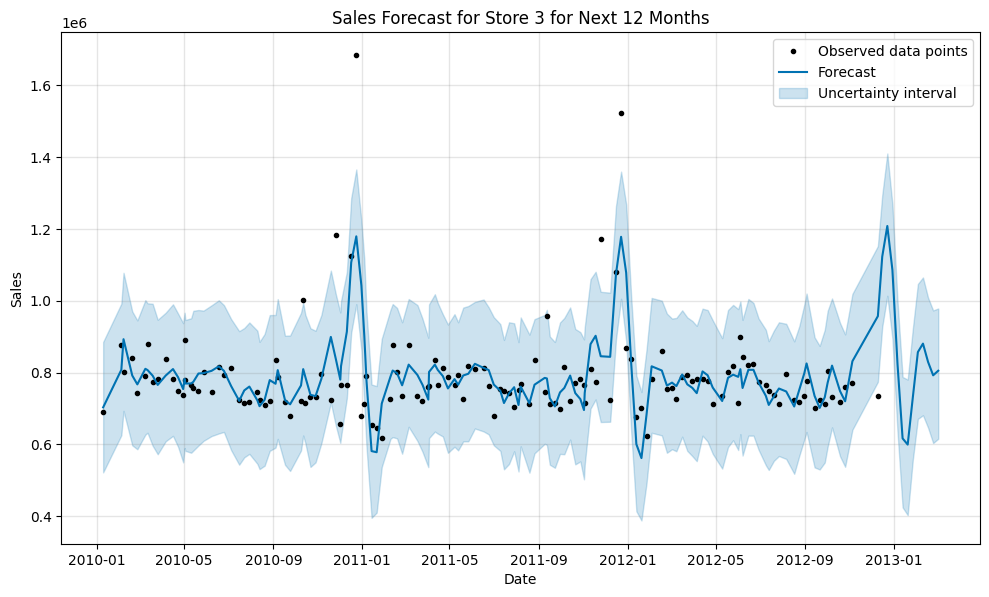

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/4cybw5be.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/lx3fqvvy.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=70689', 'data', 'file=/tmp/tmptwuzpm09/4cybw5be.json', 'init=/tmp/tmptwuzpm09/lx3fqvvy.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_model12ijmv0d/prophet_model-20240327055615.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:15 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:15 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


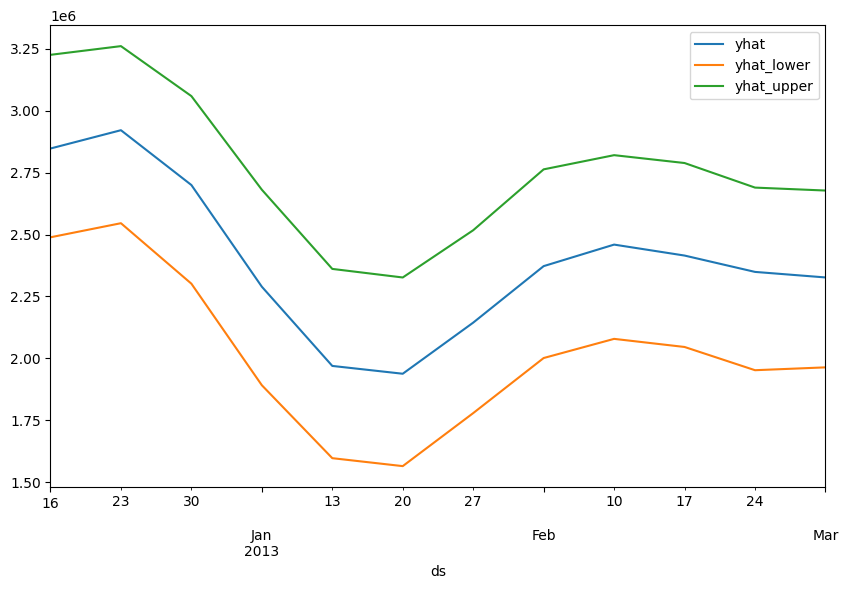

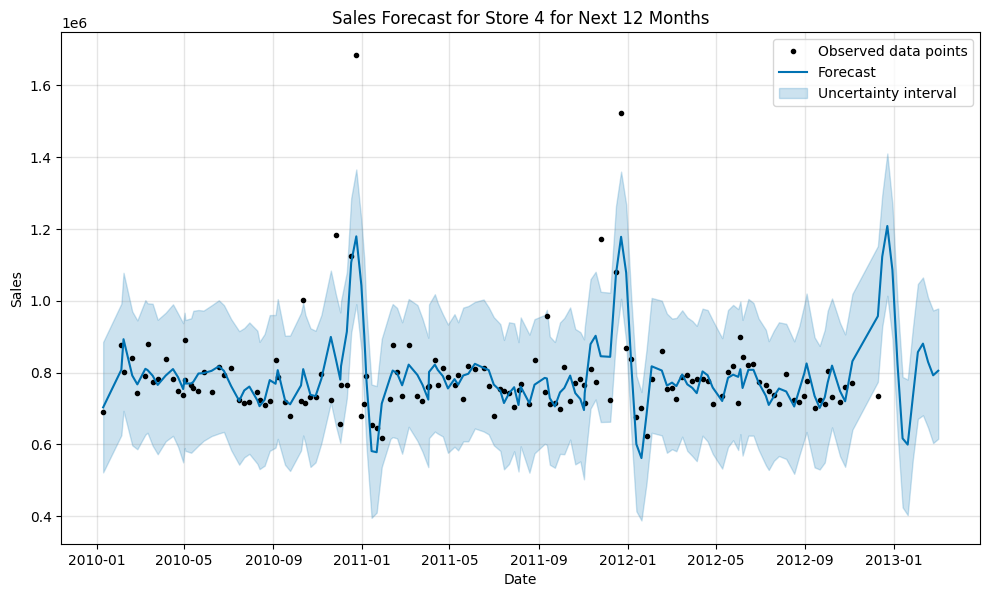

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/ftxje41p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/3n70potq.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7378', 'data', 'file=/tmp/tmptwuzpm09/ftxje41p.json', 'init=/tmp/tmptwuzpm09/3n70potq.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modeljdizpfrs/prophet_model-20240327055616.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:16 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:16 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


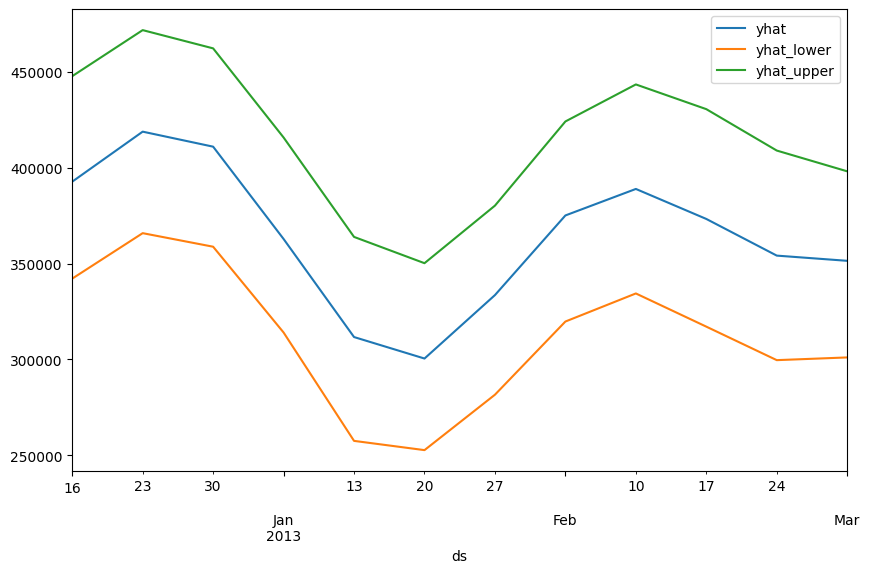

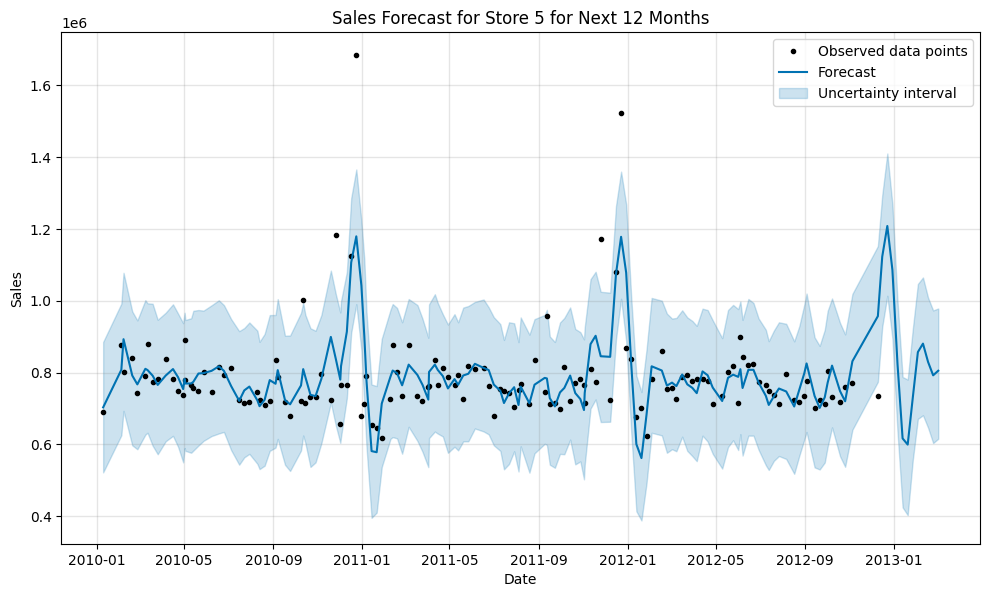

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/vtkug2c3.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/qx89d0f1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=40863', 'data', 'file=/tmp/tmptwuzpm09/vtkug2c3.json', 'init=/tmp/tmptwuzpm09/qx89d0f1.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_model3jyl0ism/prophet_model-20240327055617.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:17 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:17 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


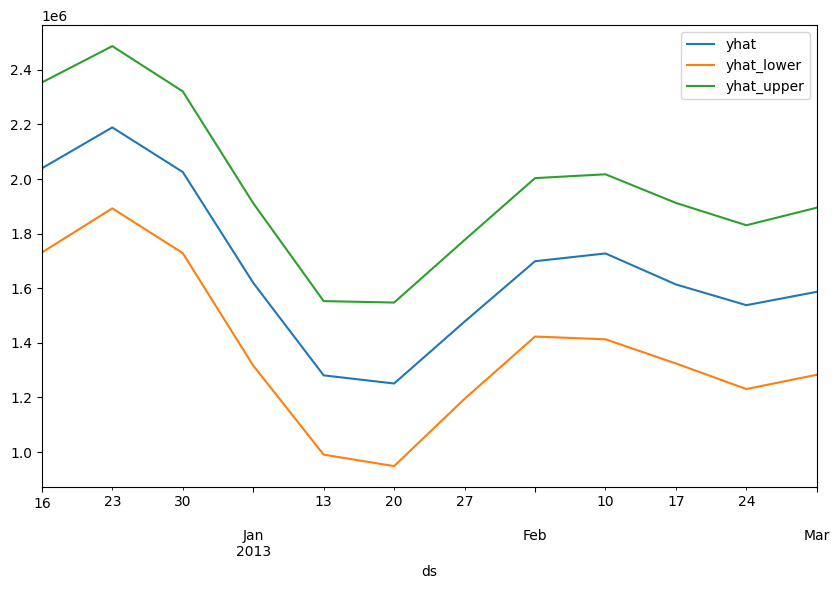

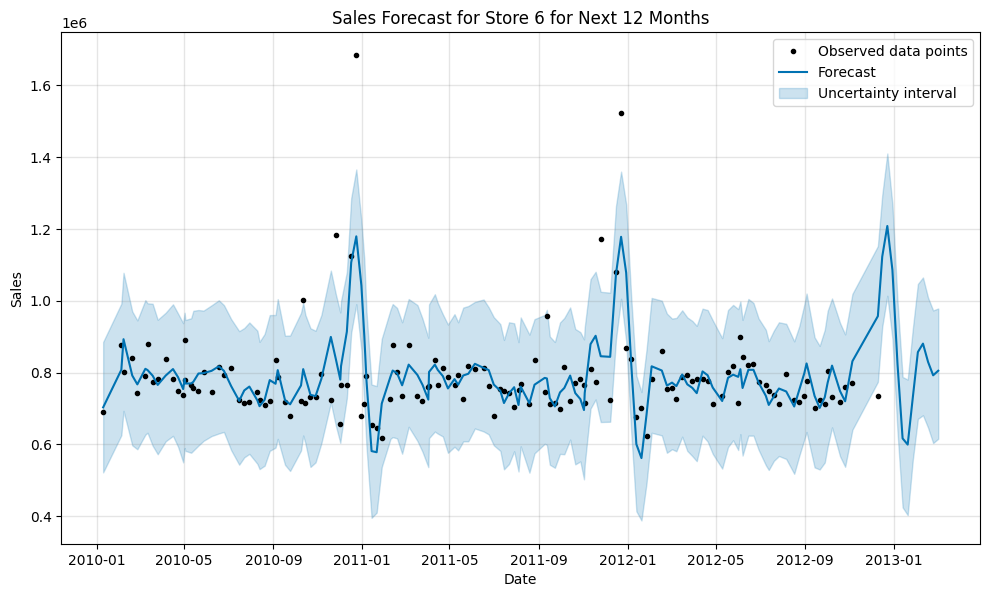

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/oi20__9p.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/rr2evw12.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=7604', 'data', 'file=/tmp/tmptwuzpm09/oi20__9p.json', 'init=/tmp/tmptwuzpm09/rr2evw12.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelgyelu80c/prophet_model-20240327055618.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:18 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:18 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


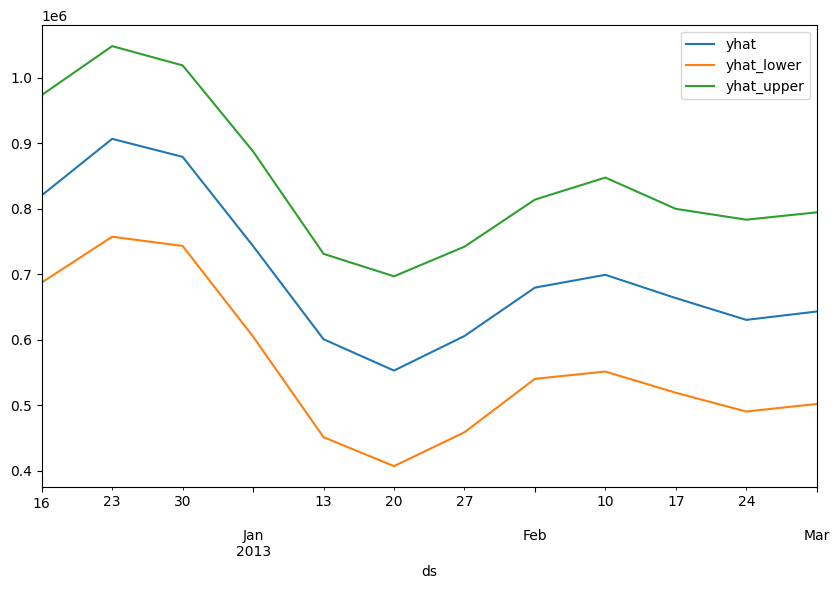

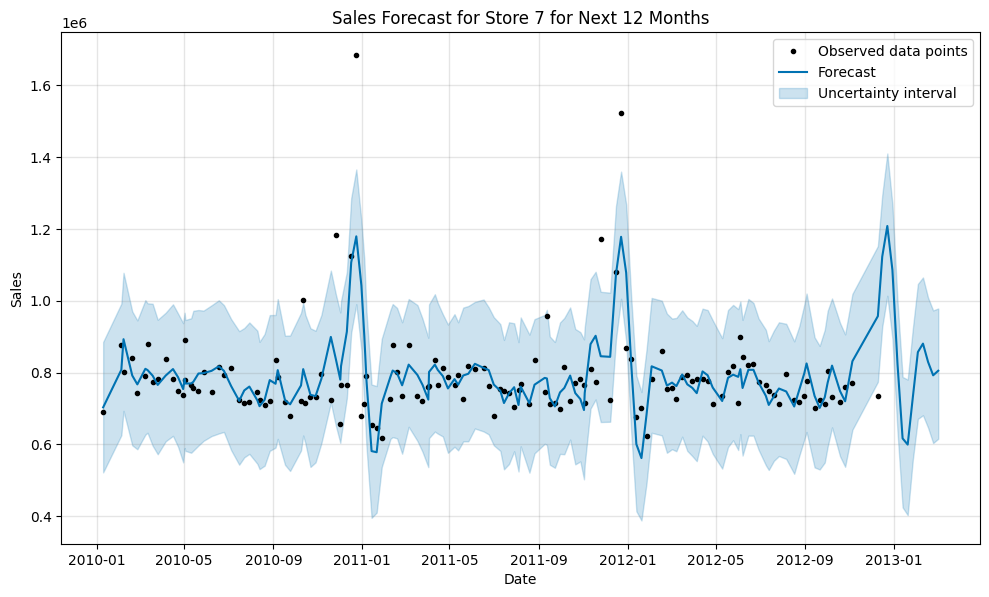

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/kijiipdh.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/8i5gcu0s.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=72318', 'data', 'file=/tmp/tmptwuzpm09/kijiipdh.json', 'init=/tmp/tmptwuzpm09/8i5gcu0s.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_model8_m2q3k3/prophet_model-20240327055619.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:19 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:19 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


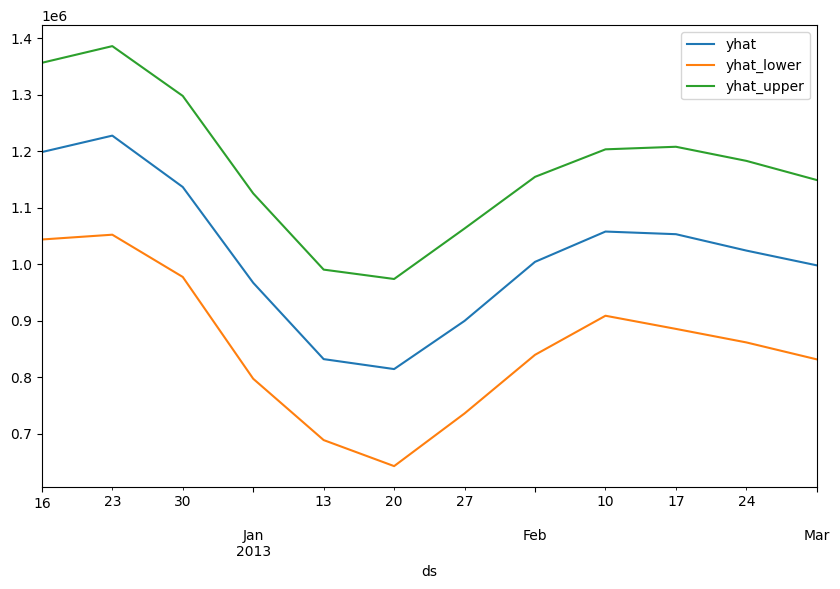

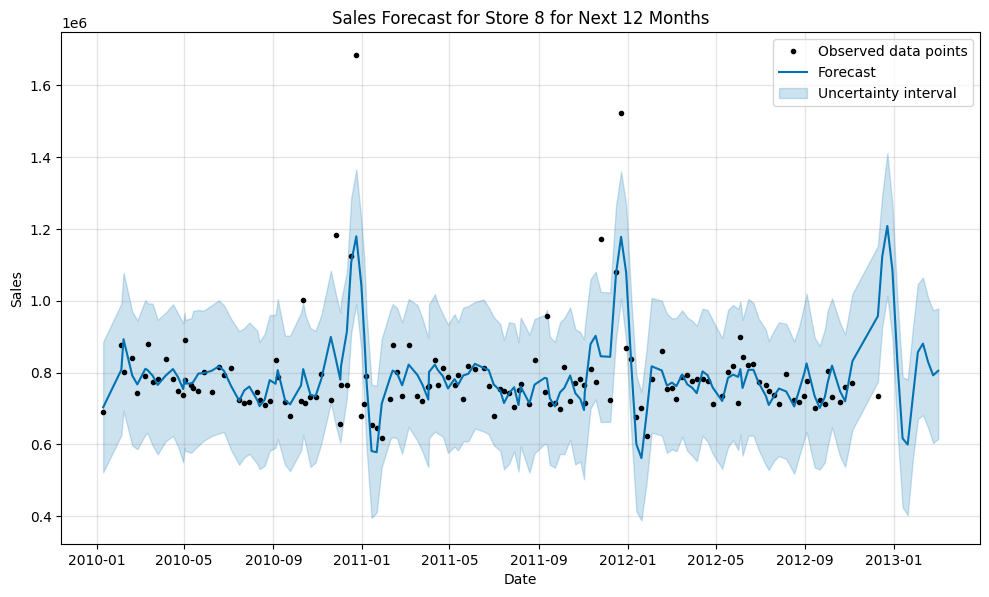

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/y4jvincm.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/8butebng.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=76601', 'data', 'file=/tmp/tmptwuzpm09/y4jvincm.json', 'init=/tmp/tmptwuzpm09/8butebng.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelxhgoj30q/prophet_model-20240327055620.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:20 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:20 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


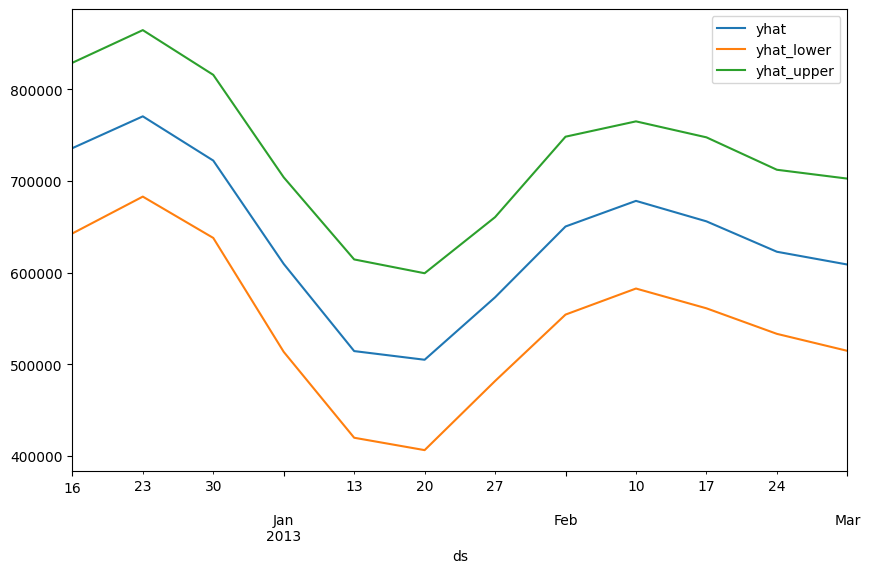

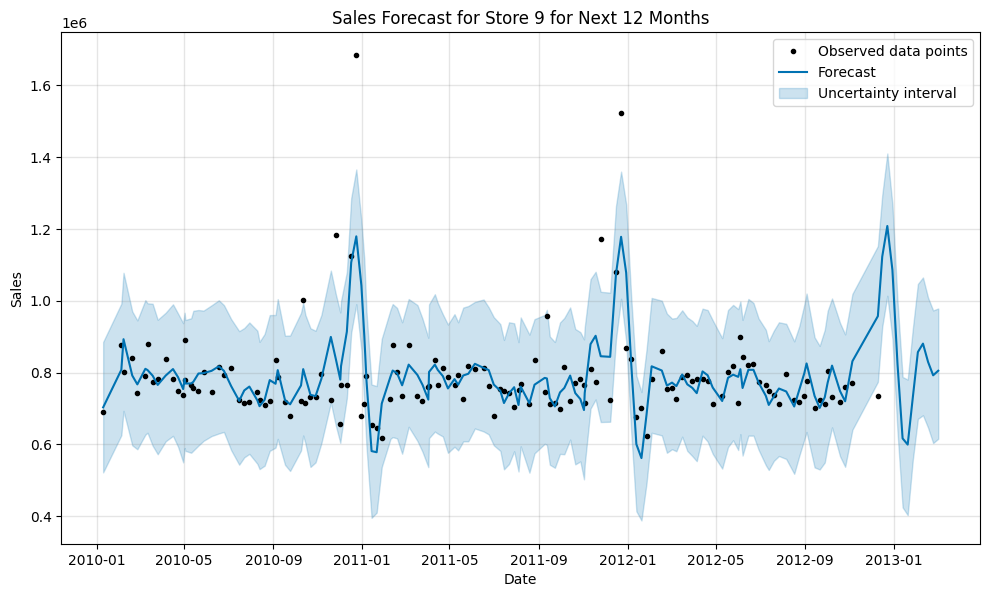

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/8gi29m6c.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/yg9ui0ph.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38832', 'data', 'file=/tmp/tmptwuzpm09/8gi29m6c.json', 'init=/tmp/tmptwuzpm09/yg9ui0ph.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_model63x06qah/prophet_model-20240327055622.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:22 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


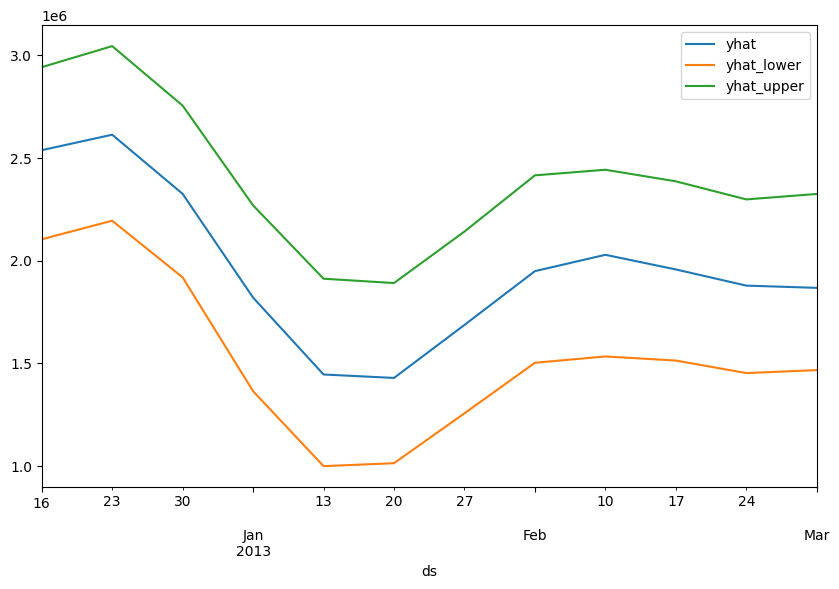

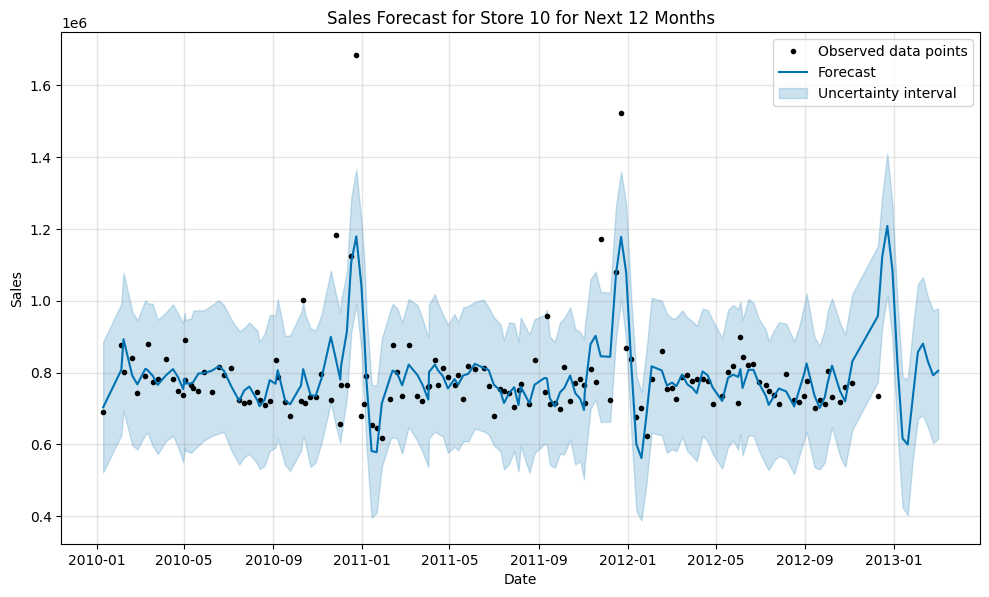

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/xkpjzppy.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/_qsk8gf0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=38827', 'data', 'file=/tmp/tmptwuzpm09/xkpjzppy.json', 'init=/tmp/tmptwuzpm09/_qsk8gf0.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelppkt9ozb/prophet_model-20240327055623.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:23 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:23 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


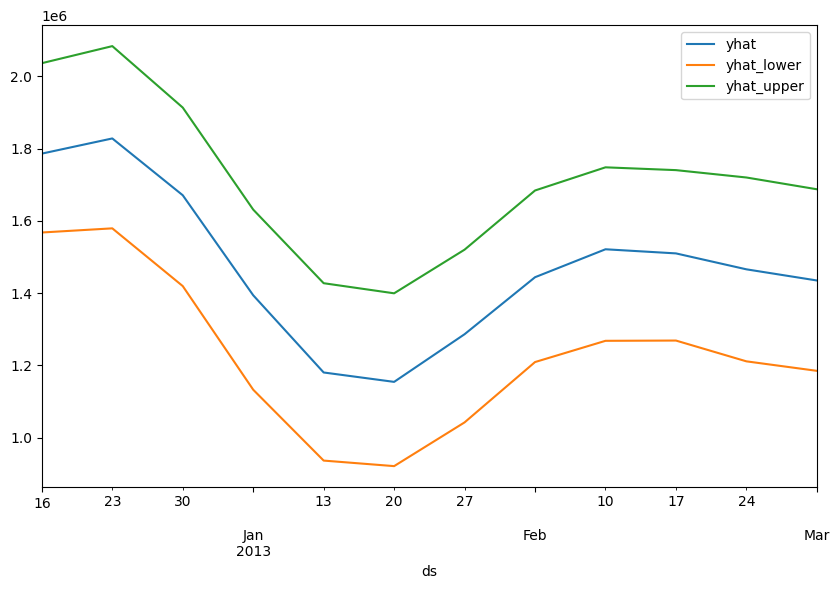

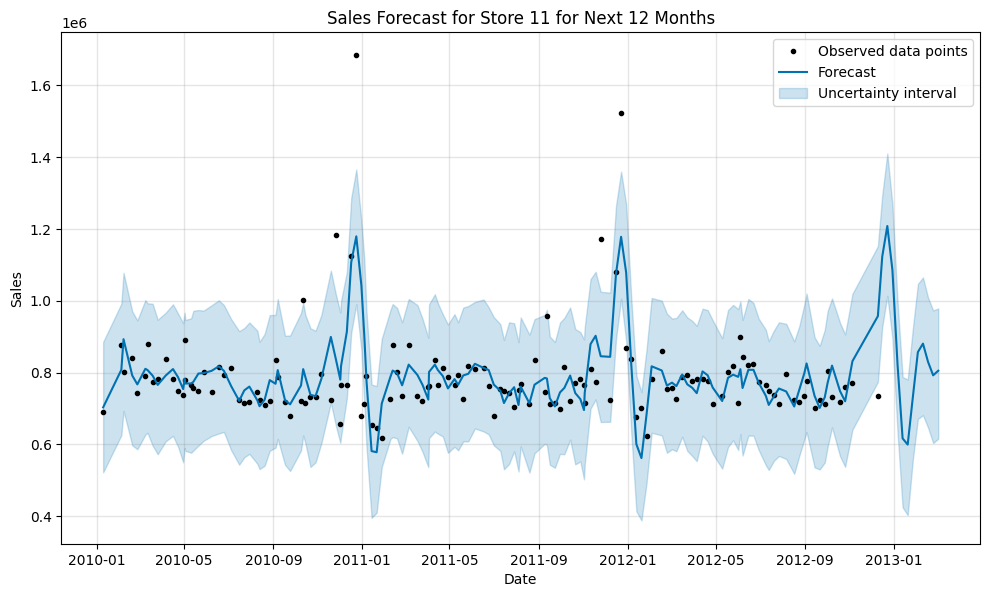

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/u9e9t3ad.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/afqa4e0b.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=85713', 'data', 'file=/tmp/tmptwuzpm09/u9e9t3ad.json', 'init=/tmp/tmptwuzpm09/afqa4e0b.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelv9t7591b/prophet_model-20240327055624.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:24 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:24 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


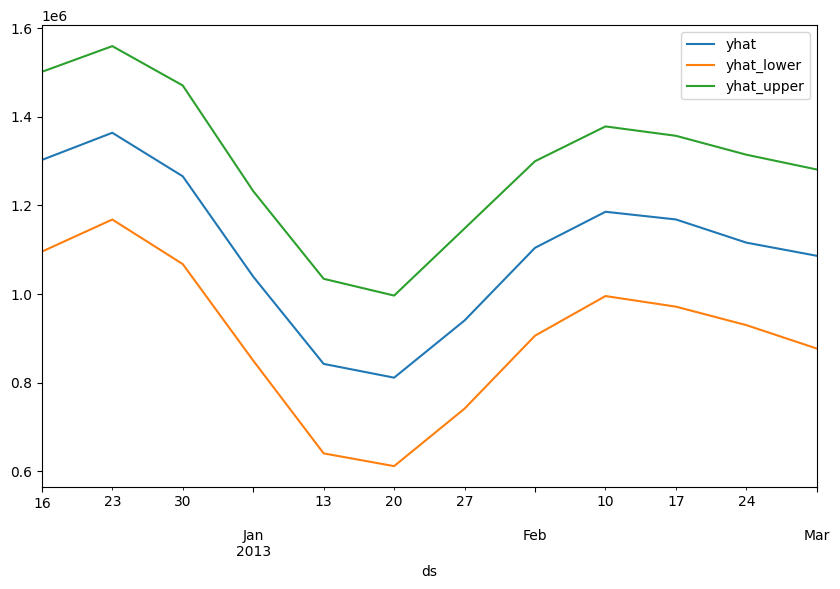

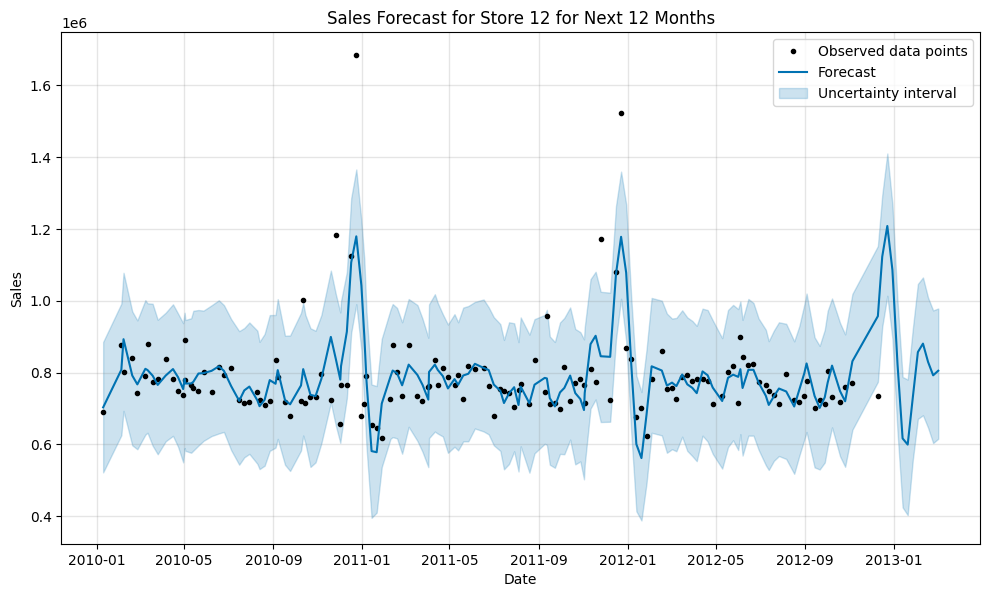

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/7tyxdfmw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/l8b85i7w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=77912', 'data', 'file=/tmp/tmptwuzpm09/7tyxdfmw.json', 'init=/tmp/tmptwuzpm09/l8b85i7w.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelseun4o55/prophet_model-20240327055625.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:25 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:25 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


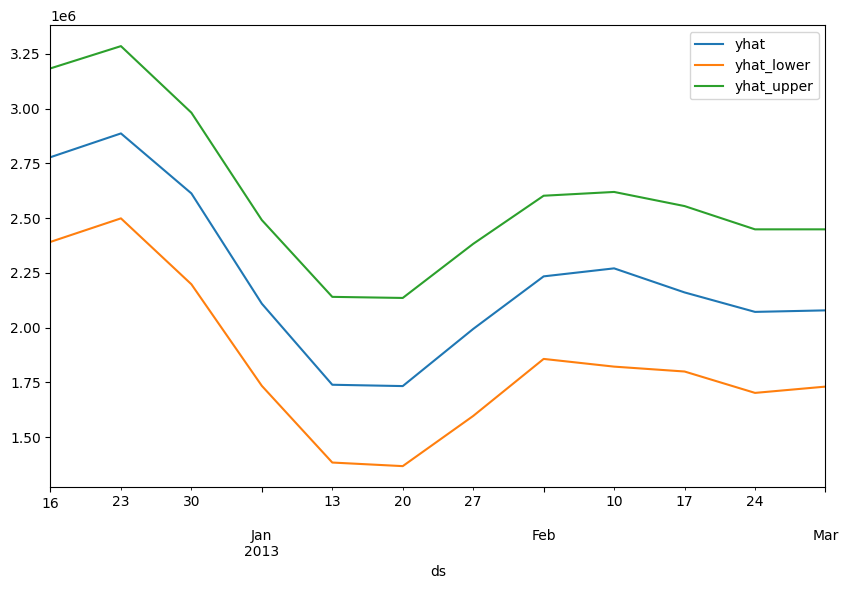

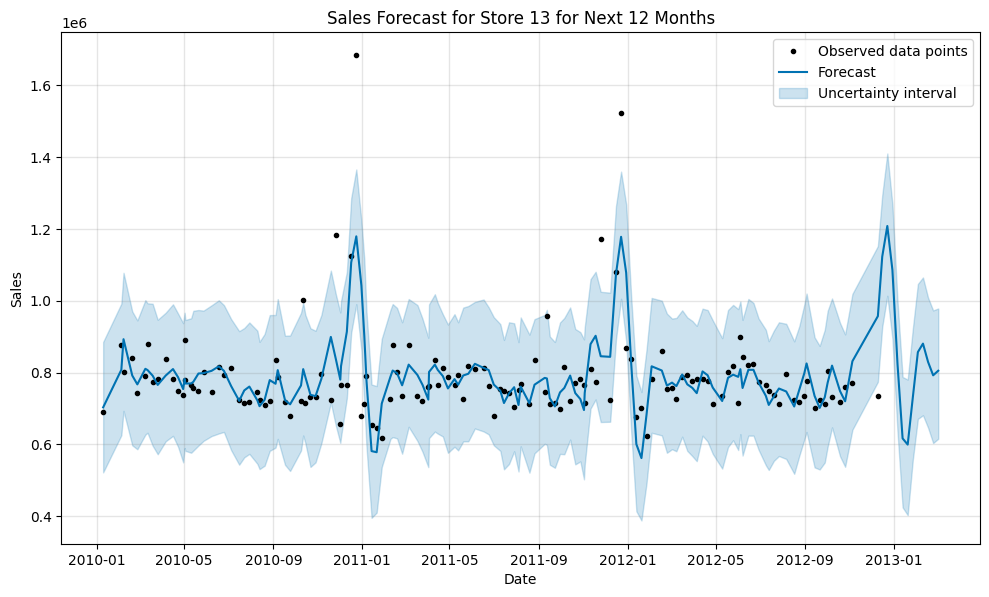

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/dwab9n7t.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/72mqfha6.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89979', 'data', 'file=/tmp/tmptwuzpm09/dwab9n7t.json', 'init=/tmp/tmptwuzpm09/72mqfha6.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelr48i3tnr/prophet_model-20240327055626.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:26 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:26 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


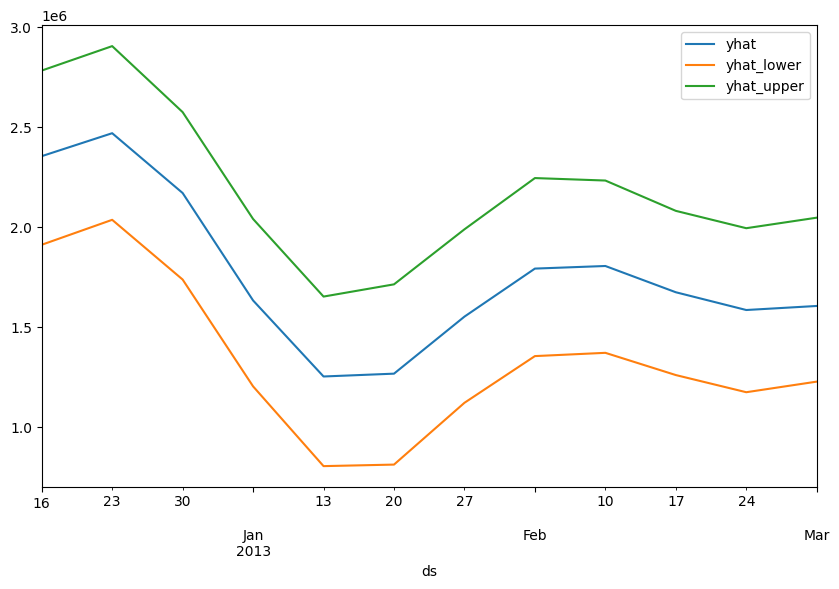

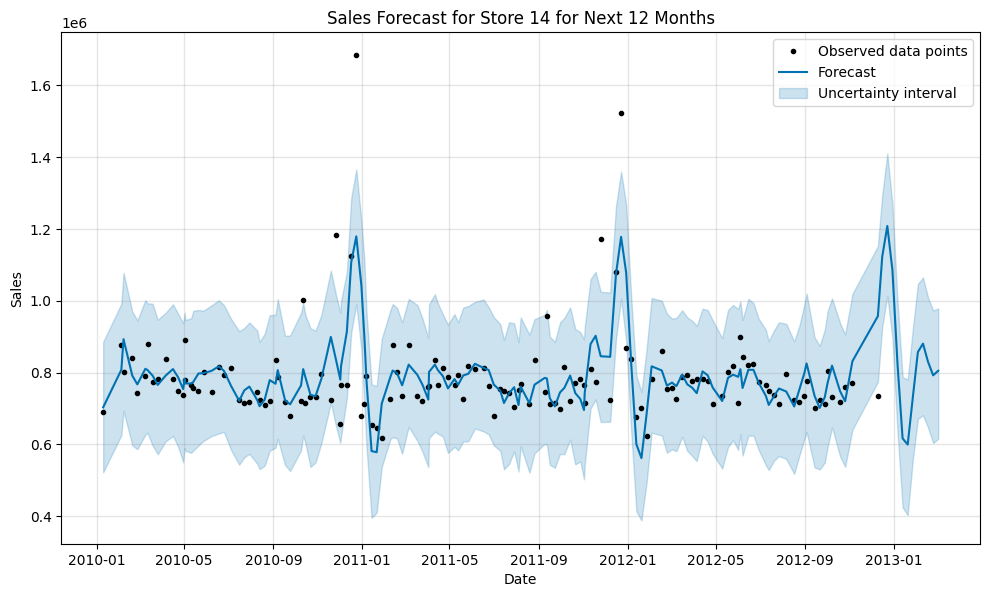

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/h_xtatzt.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/g0rww_s0.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=43717', 'data', 'file=/tmp/tmptwuzpm09/h_xtatzt.json', 'init=/tmp/tmptwuzpm09/g0rww_s0.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelu45pfgv6/prophet_model-20240327055627.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:27 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:27 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


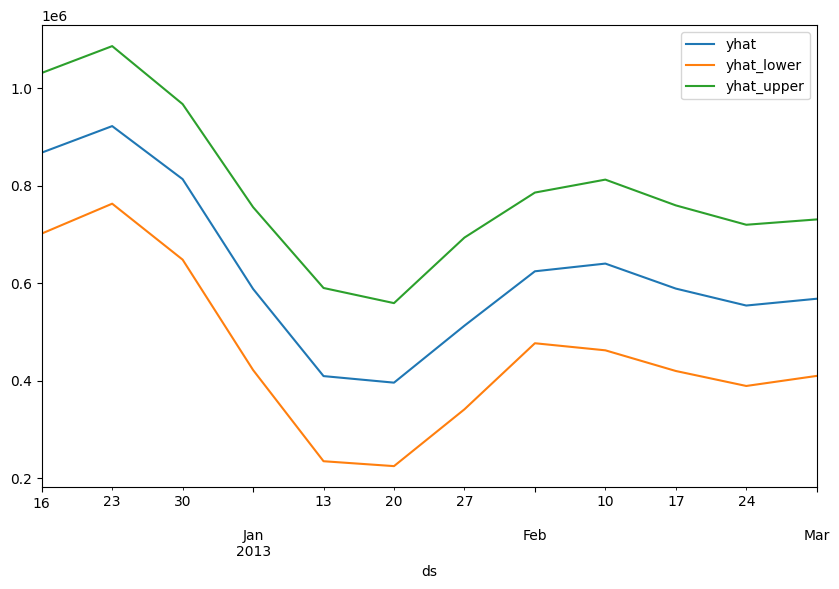

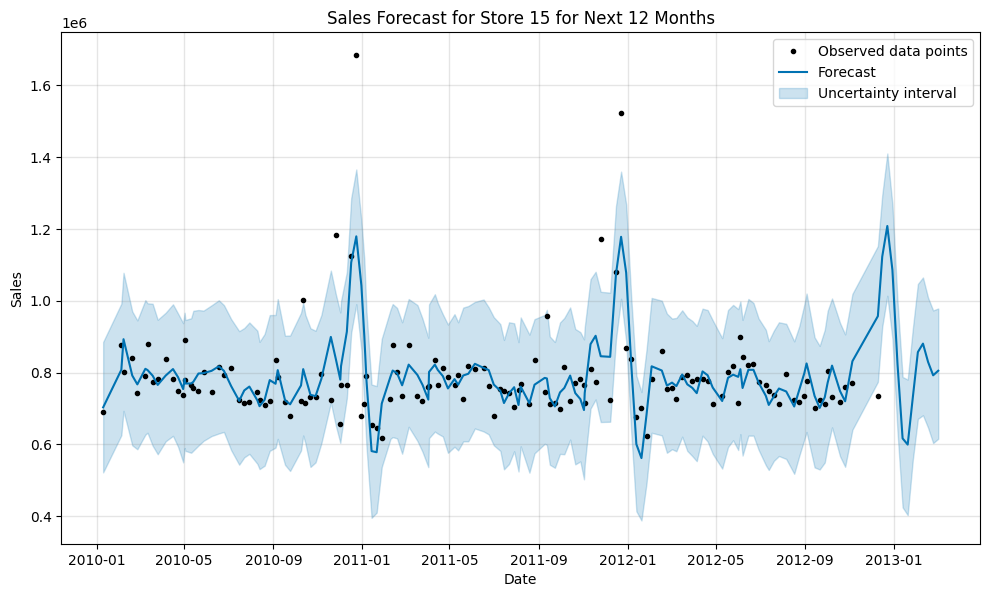

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/8mrsznma.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/t8oq08u7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=44439', 'data', 'file=/tmp/tmptwuzpm09/8mrsznma.json', 'init=/tmp/tmptwuzpm09/t8oq08u7.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_model496vhyk8/prophet_model-20240327055628.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:28 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:28 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


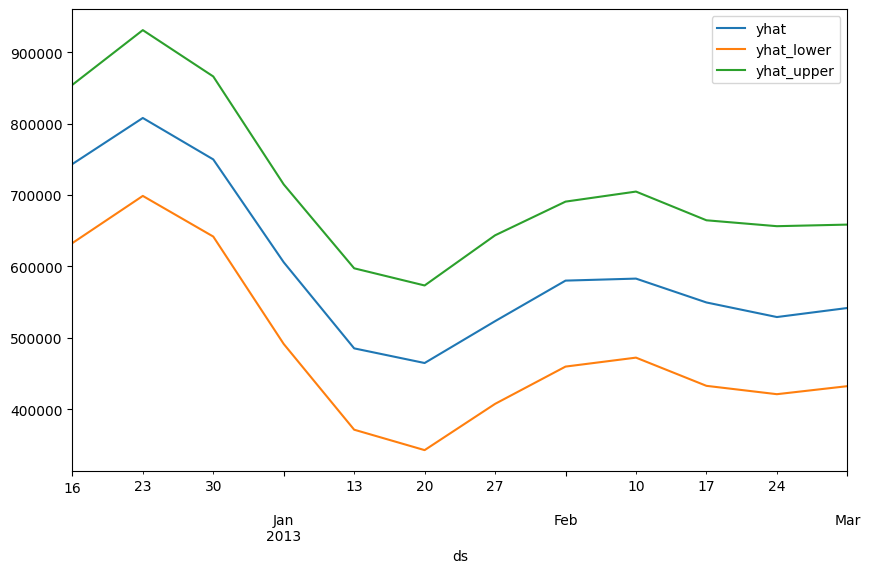

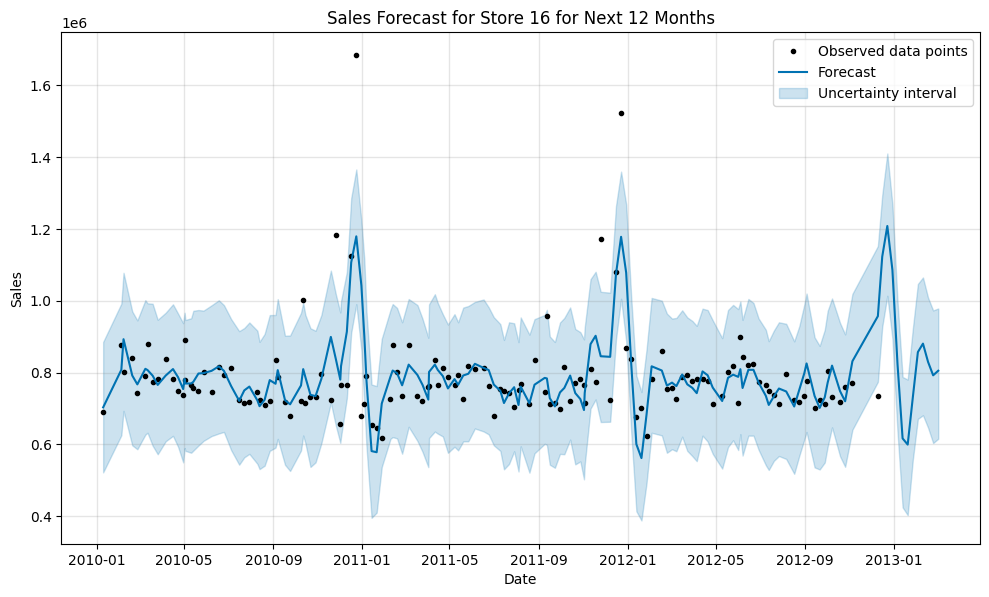

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/rnm54ppj.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/43egqkrk.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=88679', 'data', 'file=/tmp/tmptwuzpm09/rnm54ppj.json', 'init=/tmp/tmptwuzpm09/43egqkrk.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelm44a4su9/prophet_model-20240327055630.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:30 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:30 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


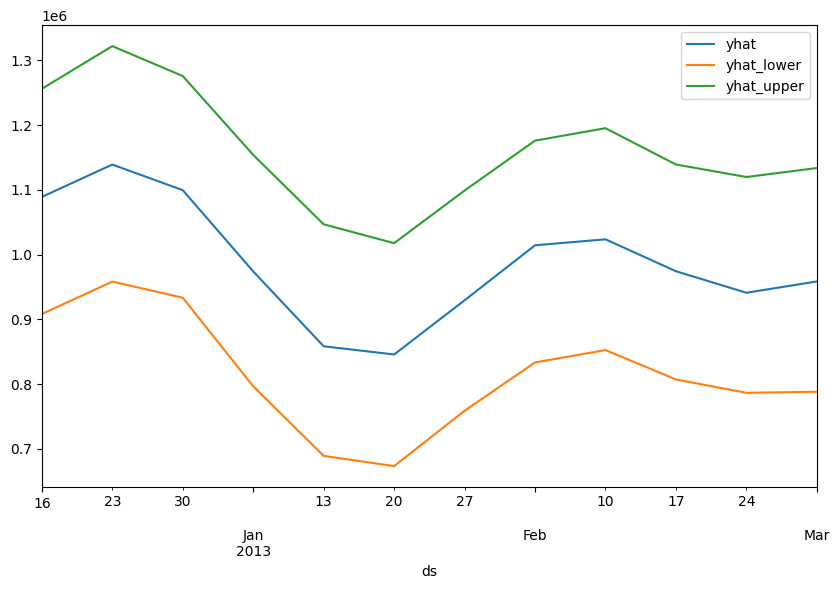

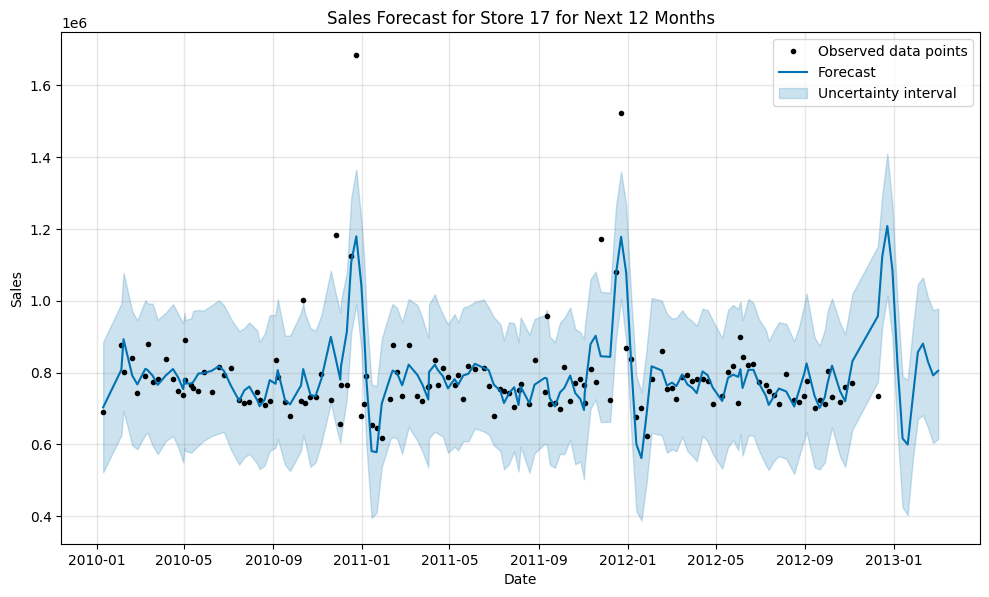

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/9qzk8474.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/3zt1o5sx.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=52614', 'data', 'file=/tmp/tmptwuzpm09/9qzk8474.json', 'init=/tmp/tmptwuzpm09/3zt1o5sx.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modeld5lpef5n/prophet_model-20240327055631.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:31 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:31 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


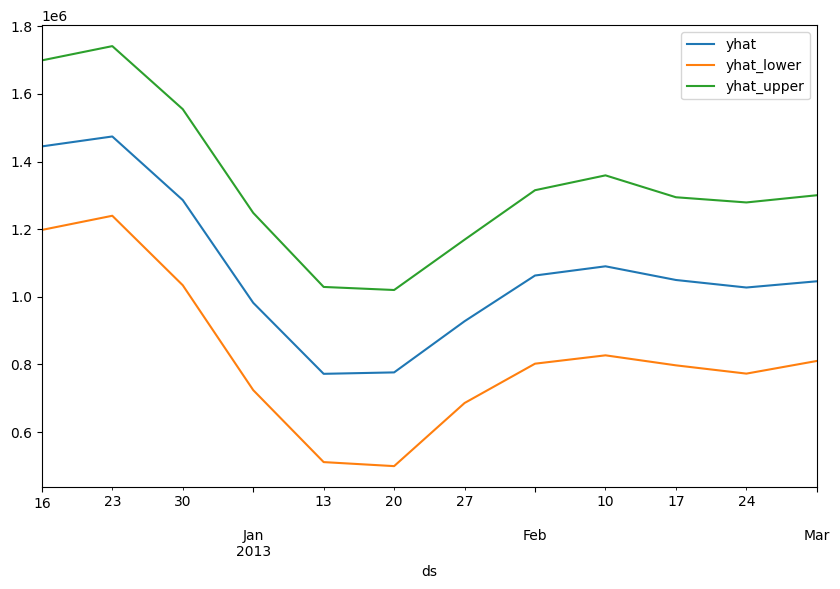

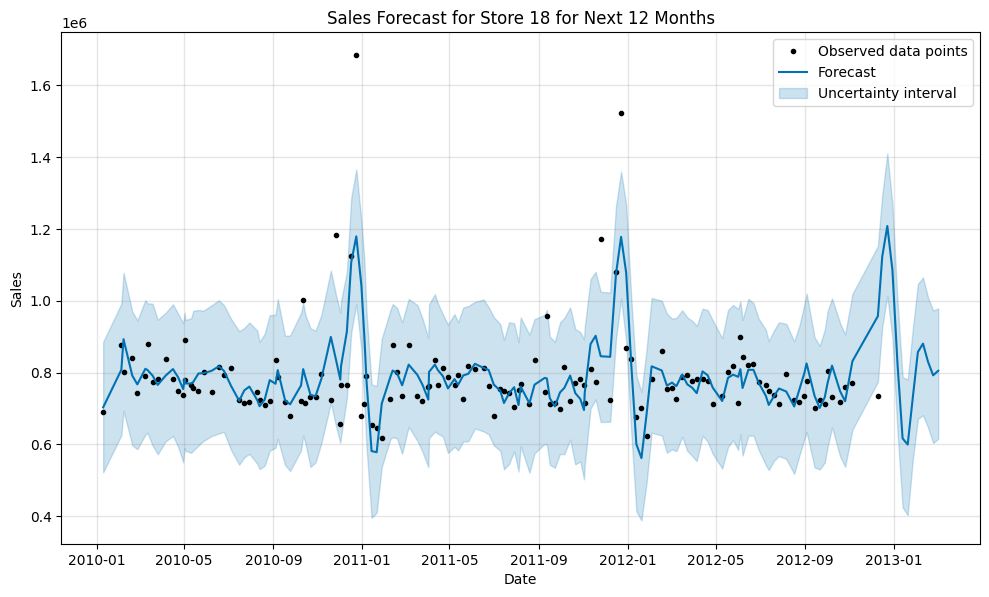

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/pcnrqydv.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/62na4wiw.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=99228', 'data', 'file=/tmp/tmptwuzpm09/pcnrqydv.json', 'init=/tmp/tmptwuzpm09/62na4wiw.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_model_cnk82gp/prophet_model-20240327055632.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:32 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:32 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


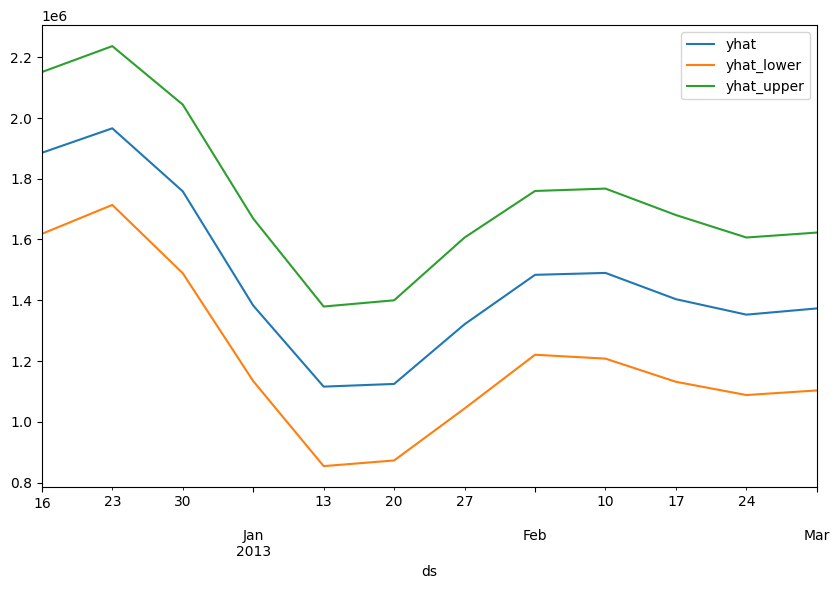

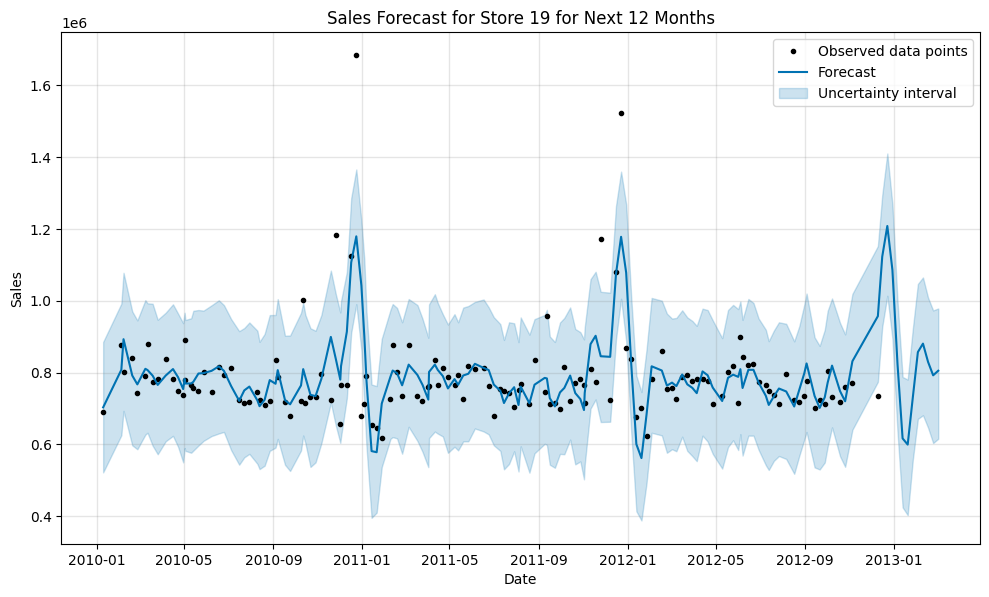

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/0r8gwntr.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/o_b70ms7.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=53130', 'data', 'file=/tmp/tmptwuzpm09/0r8gwntr.json', 'init=/tmp/tmptwuzpm09/o_b70ms7.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelrgd9fk5o/prophet_model-20240327055633.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:33 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:34 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


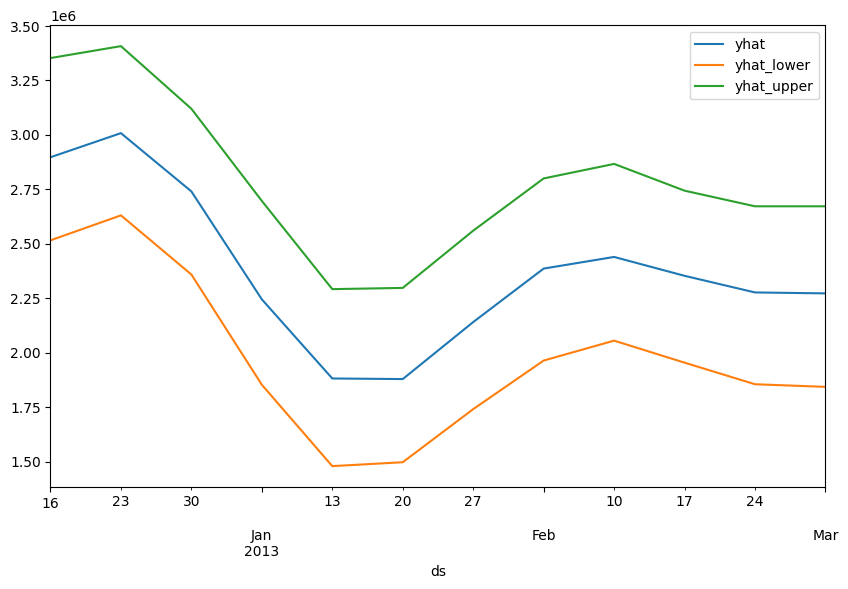

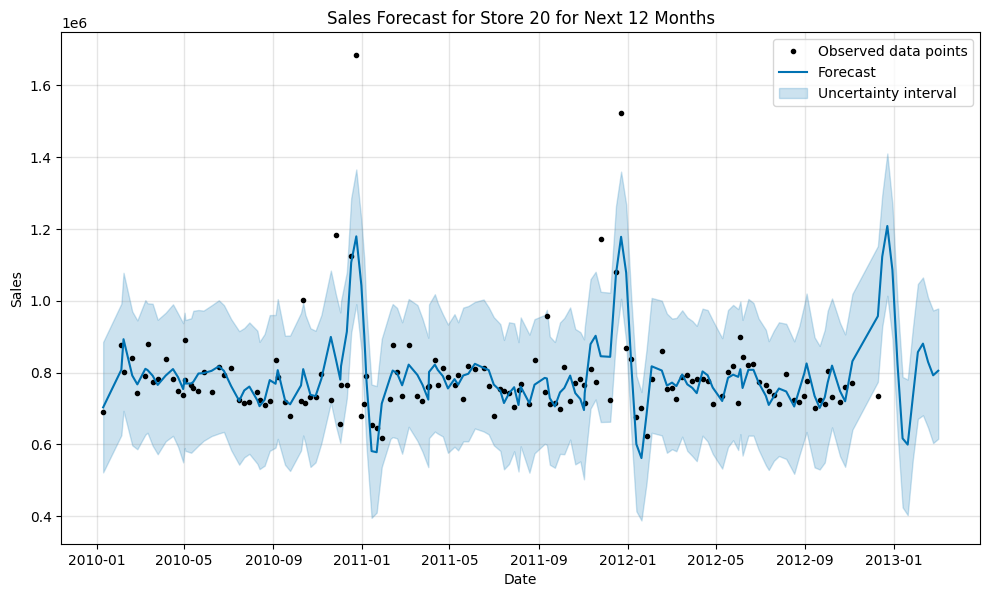

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/toqiy4r7.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/bpacdmwu.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=4783', 'data', 'file=/tmp/tmptwuzpm09/toqiy4r7.json', 'init=/tmp/tmptwuzpm09/bpacdmwu.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelxa5f0aea/prophet_model-20240327055635.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:35 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:36 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


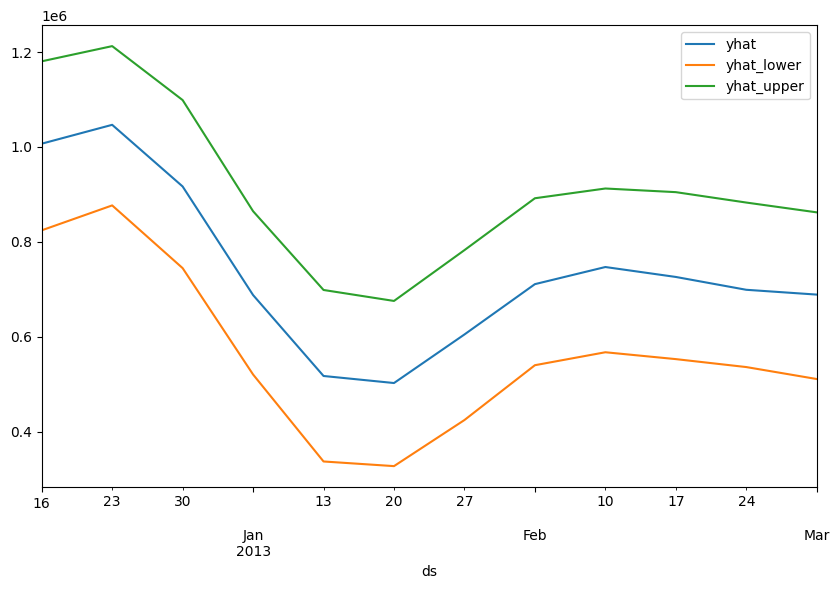

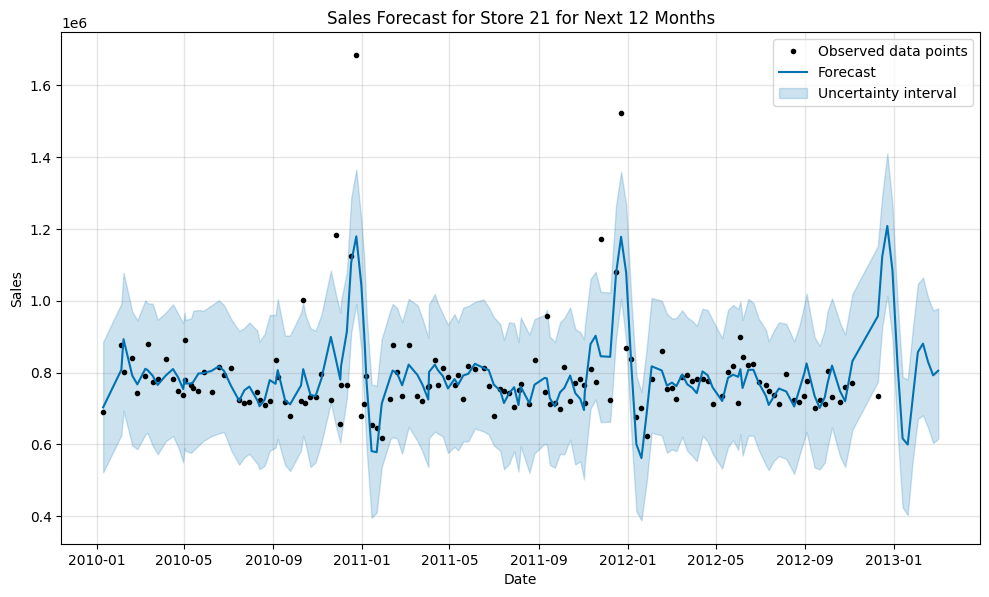

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/he35fe7a.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/x6vqsf4u.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71915', 'data', 'file=/tmp/tmptwuzpm09/he35fe7a.json', 'init=/tmp/tmptwuzpm09/x6vqsf4u.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_model1e5lmjcv/prophet_model-20240327055637.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:37 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:37 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


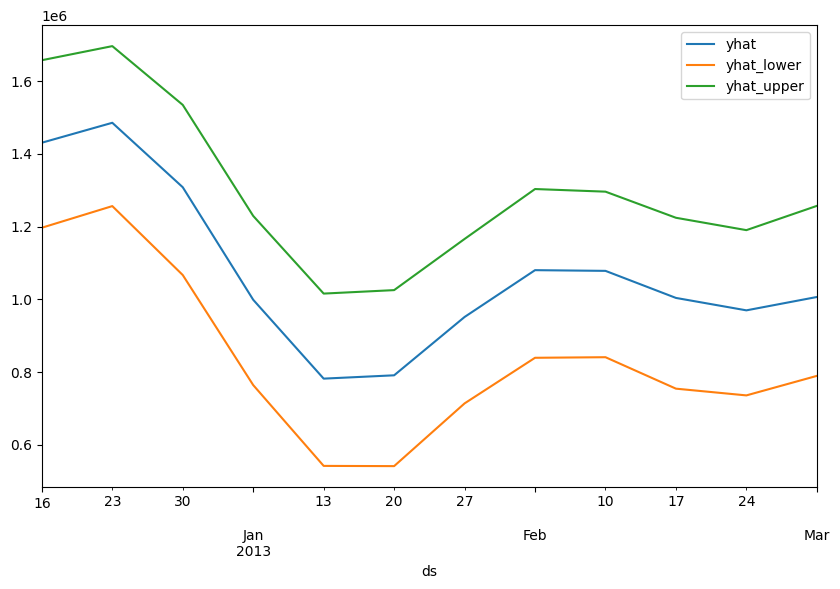

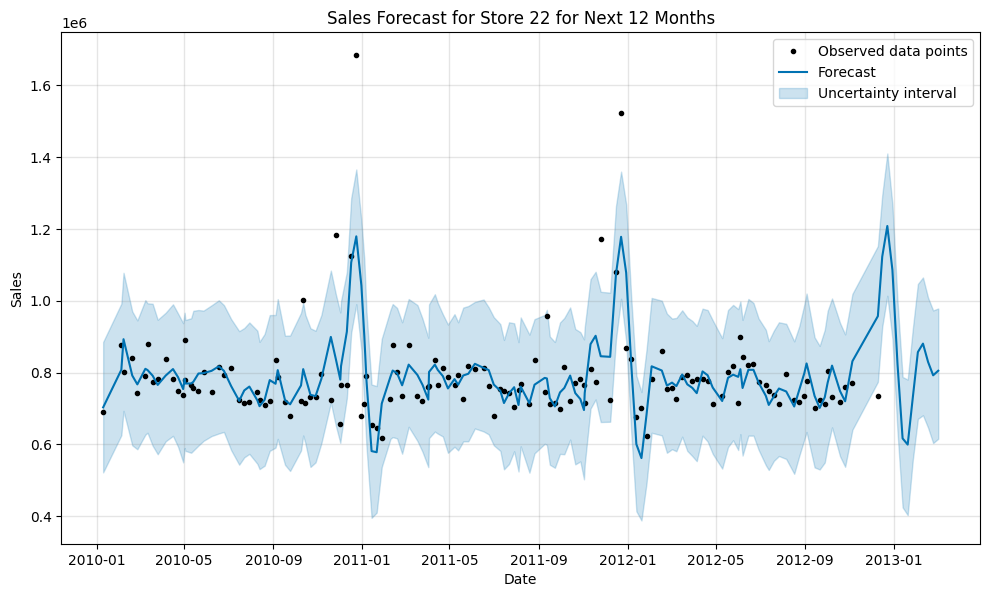

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/t5gielru.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/75__1bex.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=51219', 'data', 'file=/tmp/tmptwuzpm09/t5gielru.json', 'init=/tmp/tmptwuzpm09/75__1bex.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelcygcfxzh/prophet_model-20240327055639.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:39 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:39 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


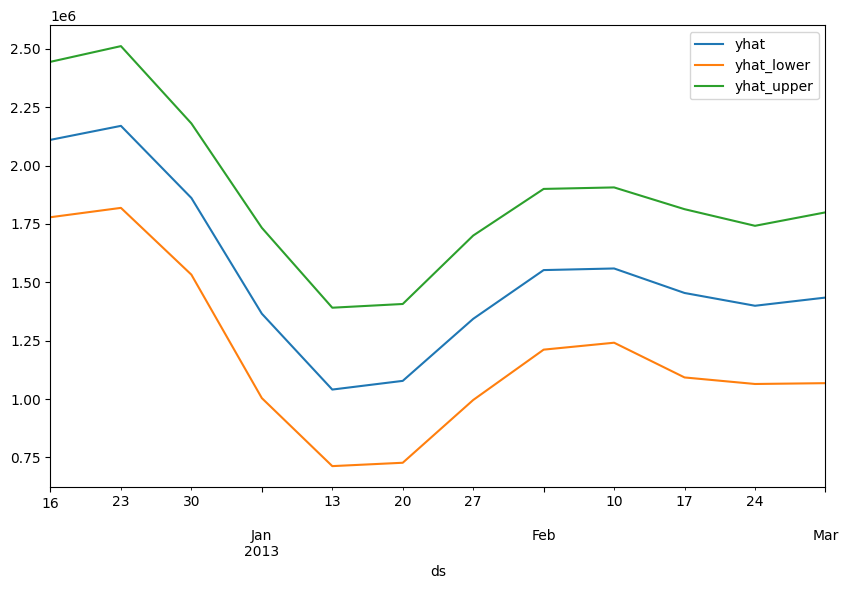

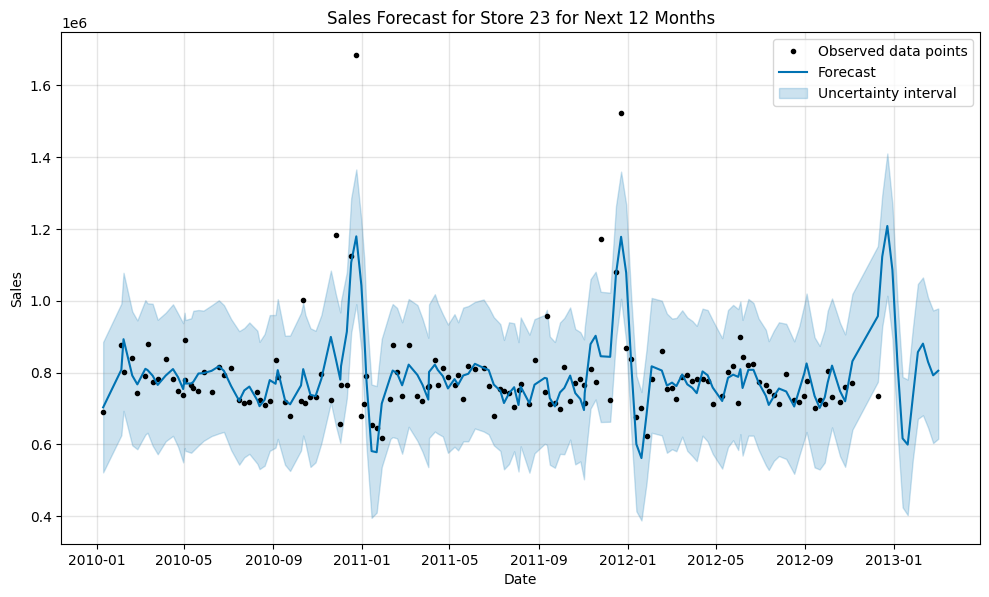

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/2dasvcf5.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/7je1iqw3.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=82157', 'data', 'file=/tmp/tmptwuzpm09/2dasvcf5.json', 'init=/tmp/tmptwuzpm09/7je1iqw3.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelg_da1m9b/prophet_model-20240327055641.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:41 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:41 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


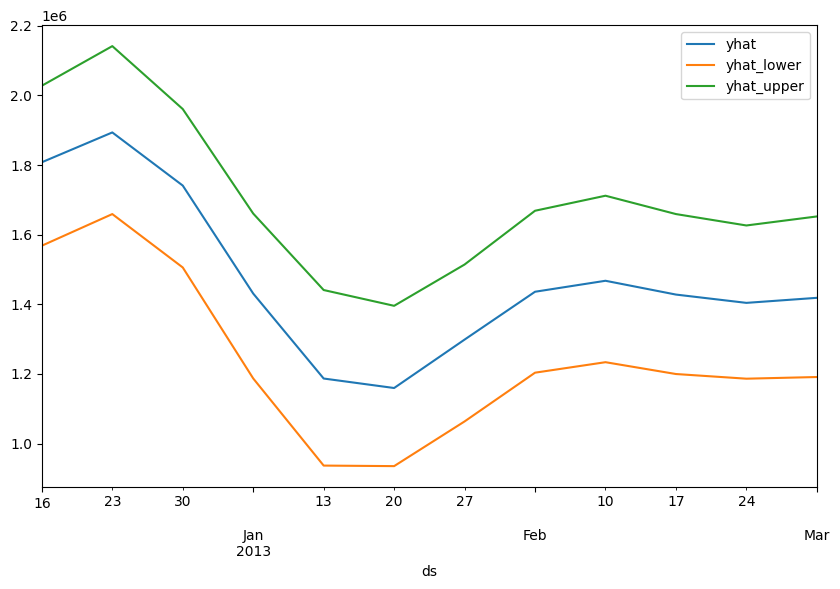

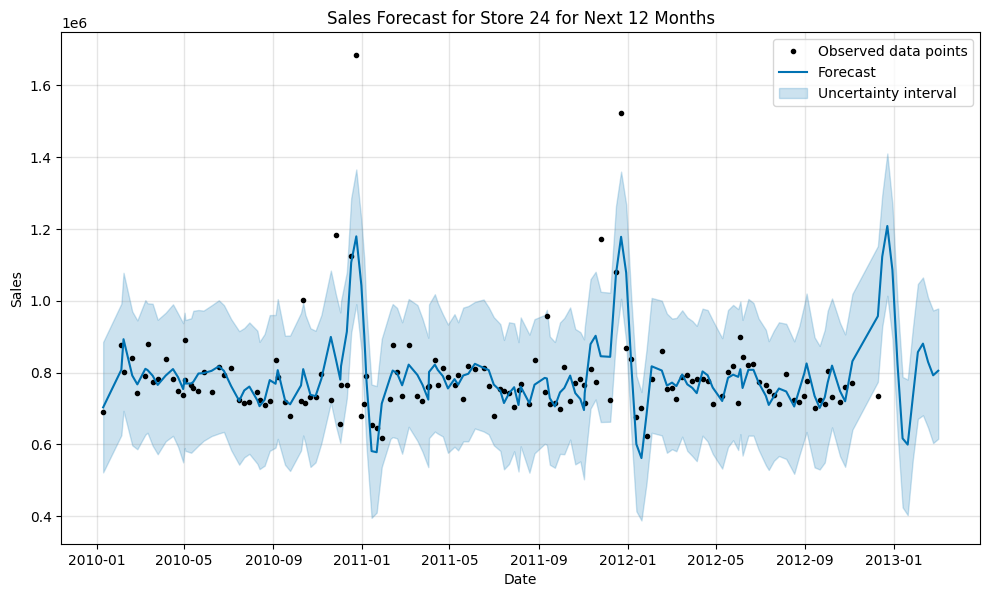

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/dcgz9o6r.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/xps62a4z.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=49838', 'data', 'file=/tmp/tmptwuzpm09/dcgz9o6r.json', 'init=/tmp/tmptwuzpm09/xps62a4z.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modellyuflt12/prophet_model-20240327055644.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:44 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:44 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


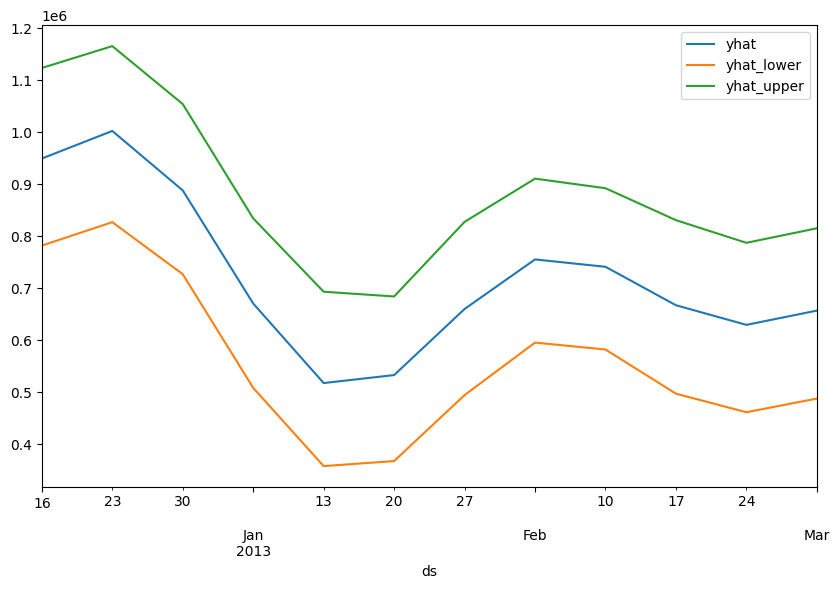

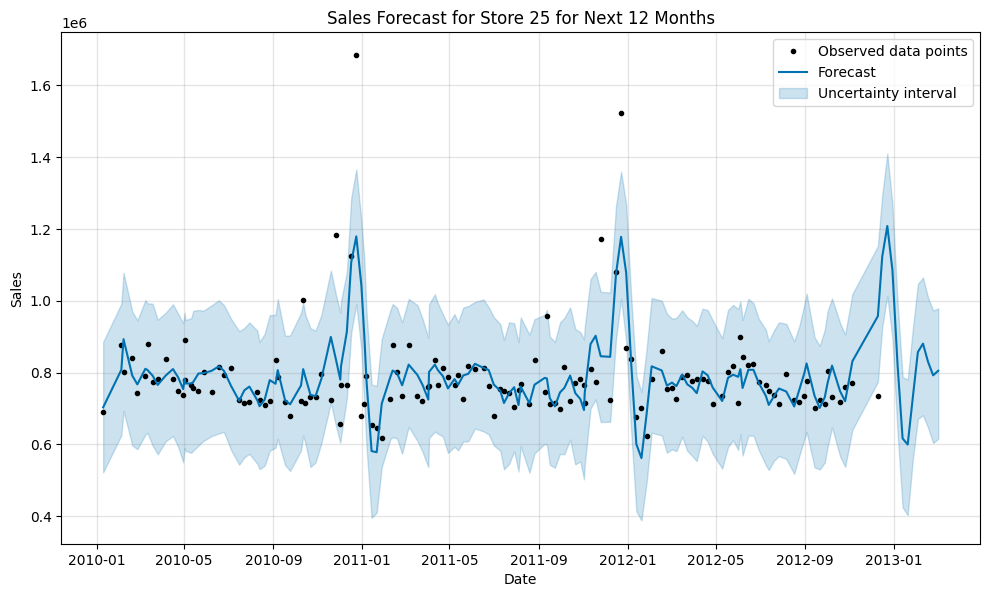

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/_00sgz44.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/ajiv8y4k.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=83487', 'data', 'file=/tmp/tmptwuzpm09/_00sgz44.json', 'init=/tmp/tmptwuzpm09/ajiv8y4k.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelhiv461lz/prophet_model-20240327055646.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:46 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:46 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


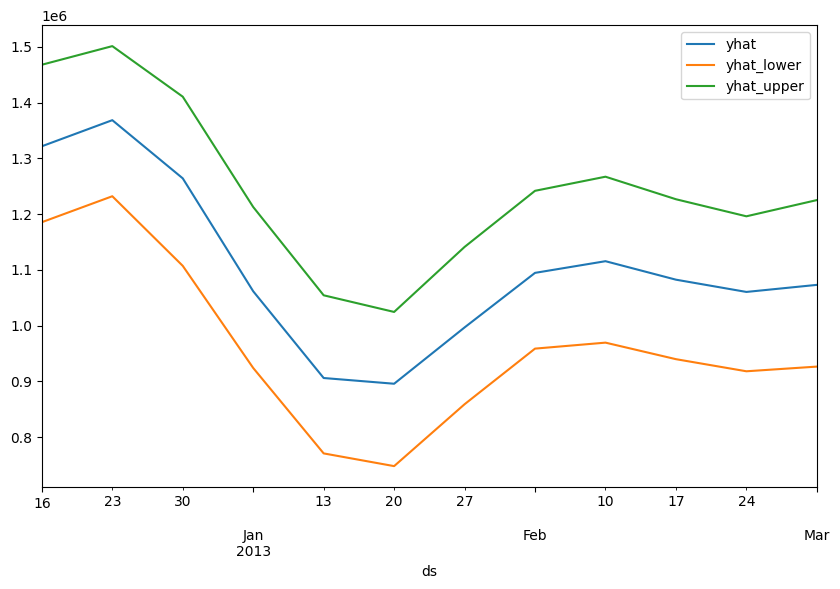

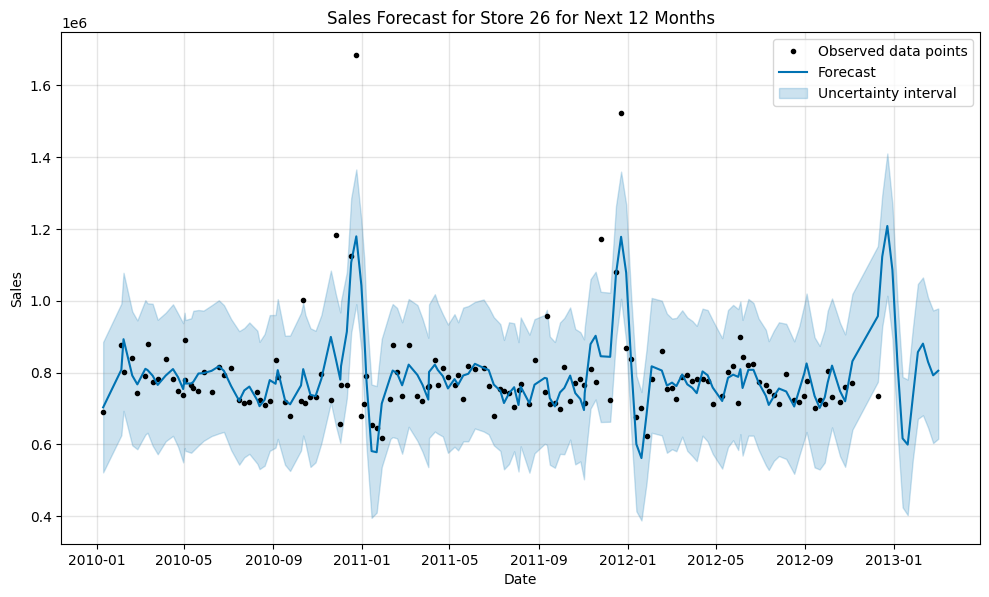

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/tuv_n9du.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/dhus1n7i.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=2661', 'data', 'file=/tmp/tmptwuzpm09/tuv_n9du.json', 'init=/tmp/tmptwuzpm09/dhus1n7i.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelm9xwzu3e/prophet_model-20240327055647.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:47 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


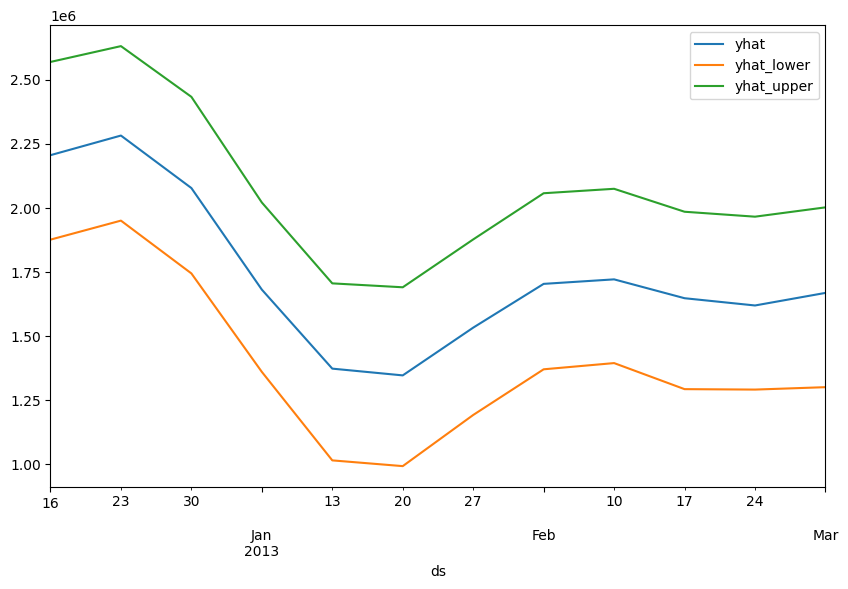

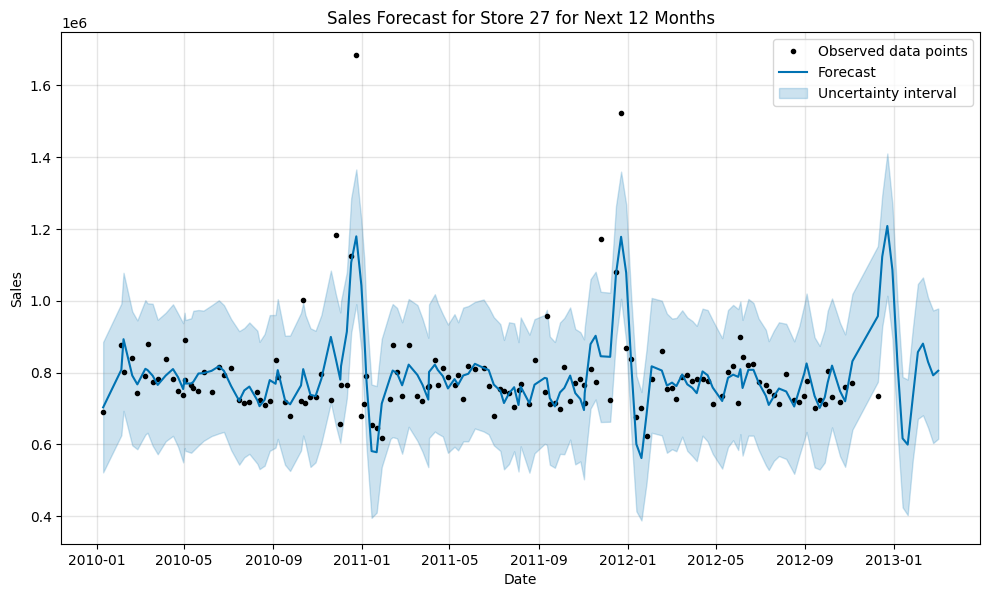

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/qlebkdc0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/2g2e8304.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=12364', 'data', 'file=/tmp/tmptwuzpm09/qlebkdc0.json', 'init=/tmp/tmptwuzpm09/2g2e8304.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_model87_dll66/prophet_model-20240327055648.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:48 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:48 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


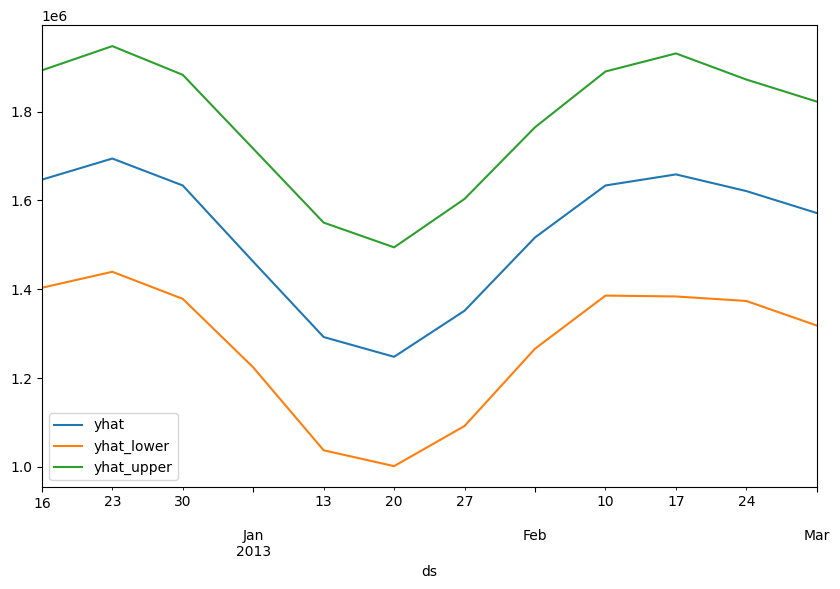

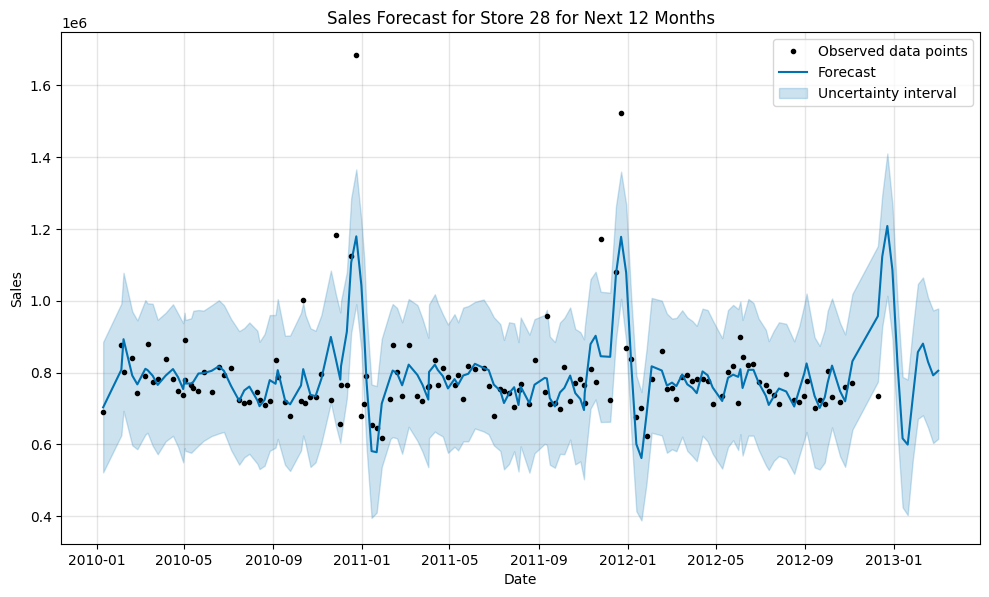

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/tcvwe4uw.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/1ayxl6y2.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63324', 'data', 'file=/tmp/tmptwuzpm09/tcvwe4uw.json', 'init=/tmp/tmptwuzpm09/1ayxl6y2.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_model_3uxvq9u/prophet_model-20240327055650.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:50 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:50 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


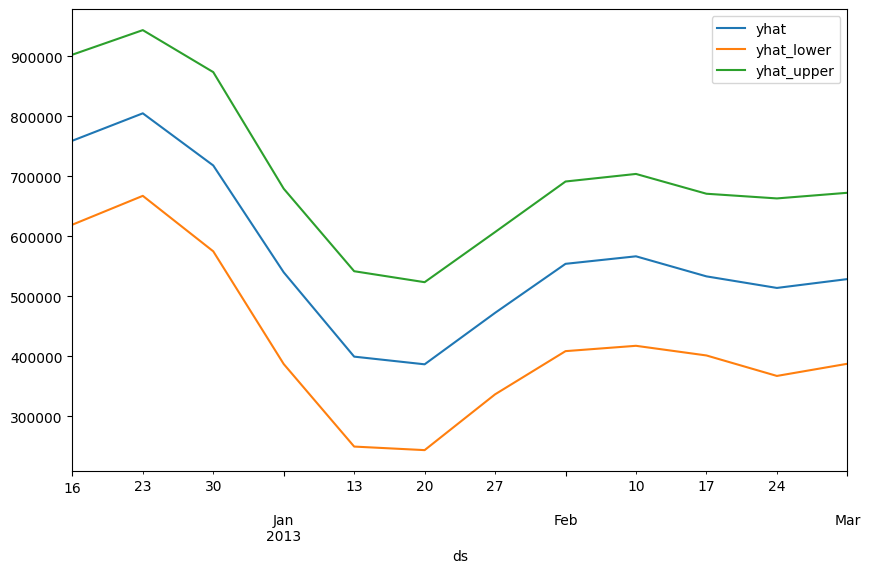

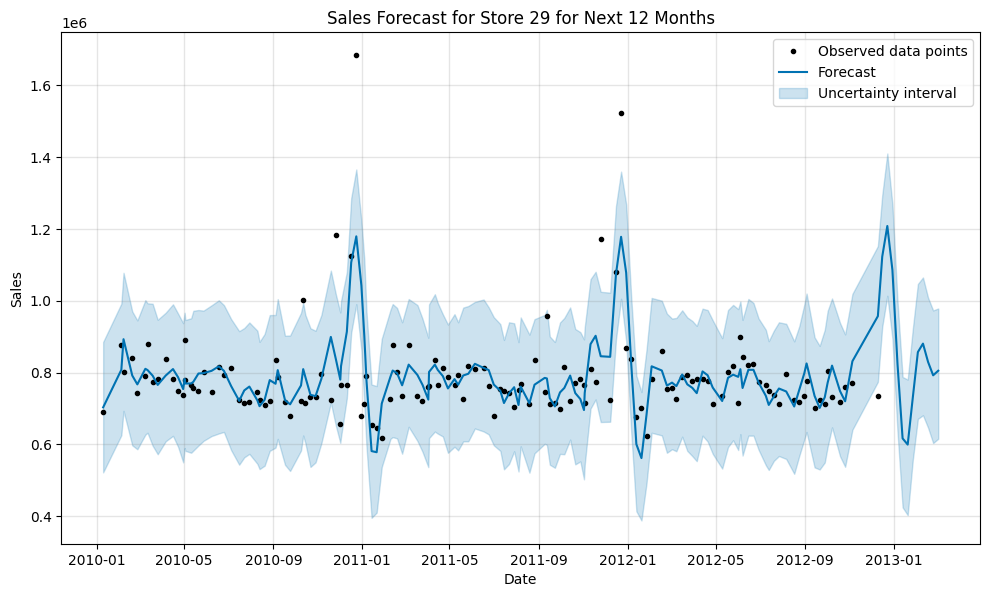

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/99cwegl9.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/_936c453.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=3887', 'data', 'file=/tmp/tmptwuzpm09/99cwegl9.json', 'init=/tmp/tmptwuzpm09/_936c453.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelnuggzlhf/prophet_model-20240327055651.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:51 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:51 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


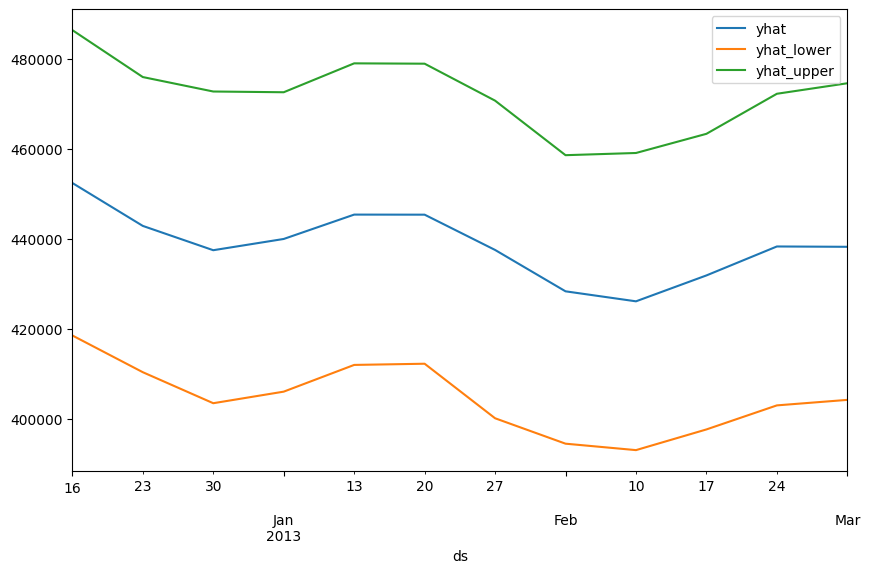

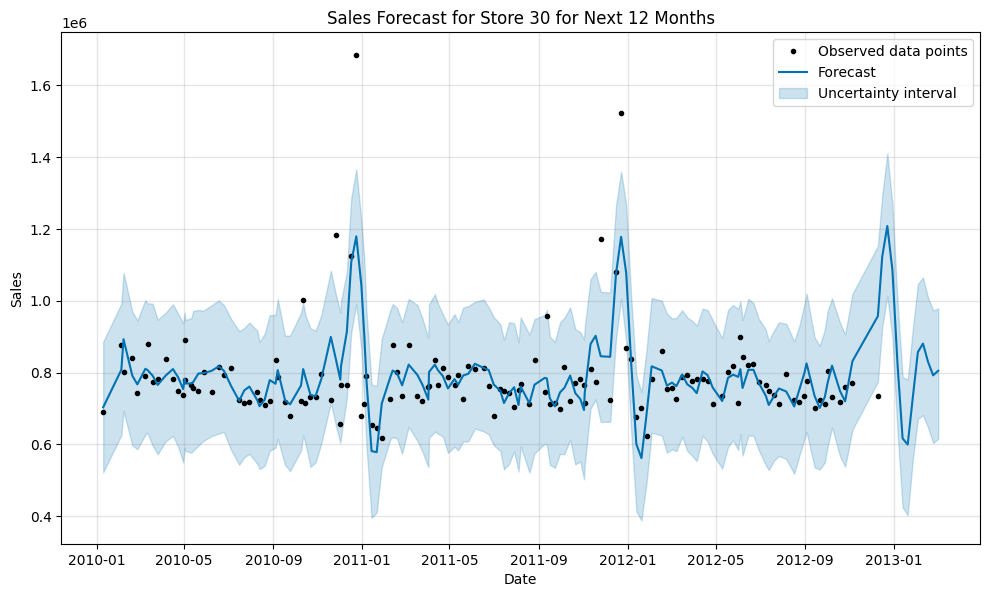

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/50282hv0.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/s3qbtv1f.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=71642', 'data', 'file=/tmp/tmptwuzpm09/50282hv0.json', 'init=/tmp/tmptwuzpm09/s3qbtv1f.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_model36mbqwmr/prophet_model-20240327055652.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:52 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:52 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


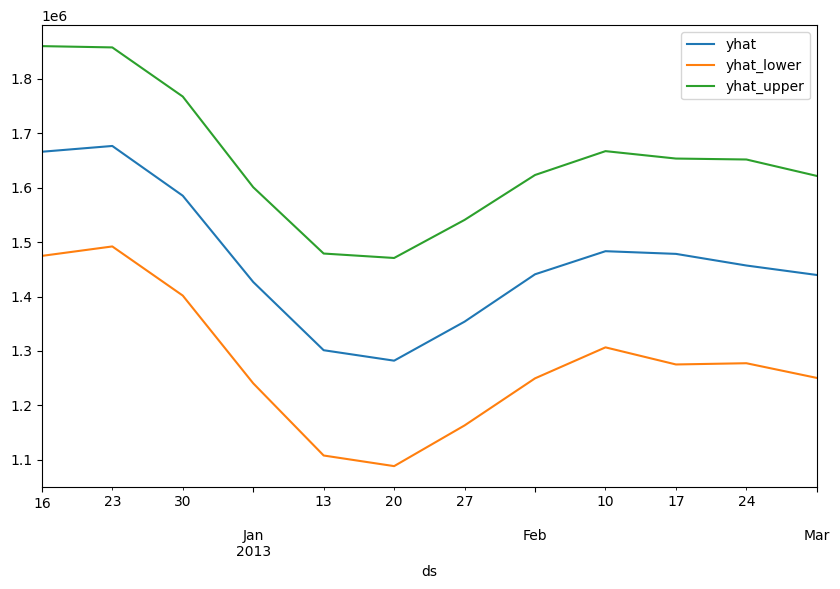

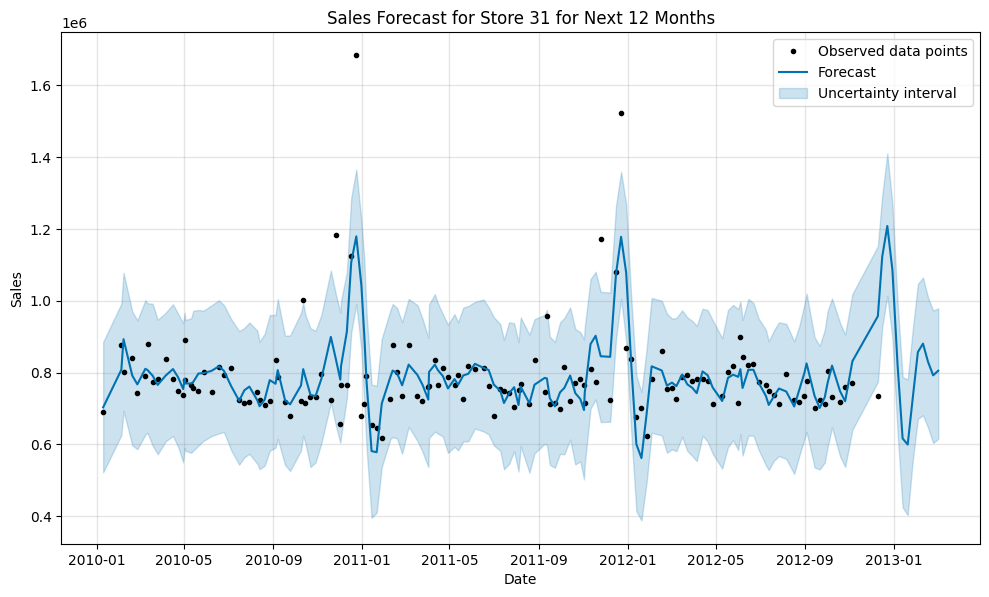

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/_9awbjh2.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/rn7q2rxr.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22614', 'data', 'file=/tmp/tmptwuzpm09/_9awbjh2.json', 'init=/tmp/tmptwuzpm09/rn7q2rxr.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelt5_a4007/prophet_model-20240327055654.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:54 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:54 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


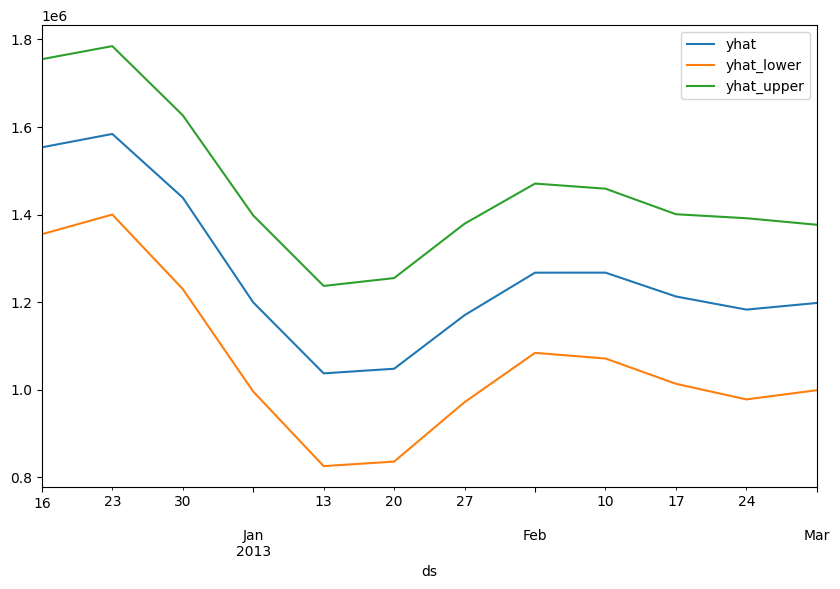

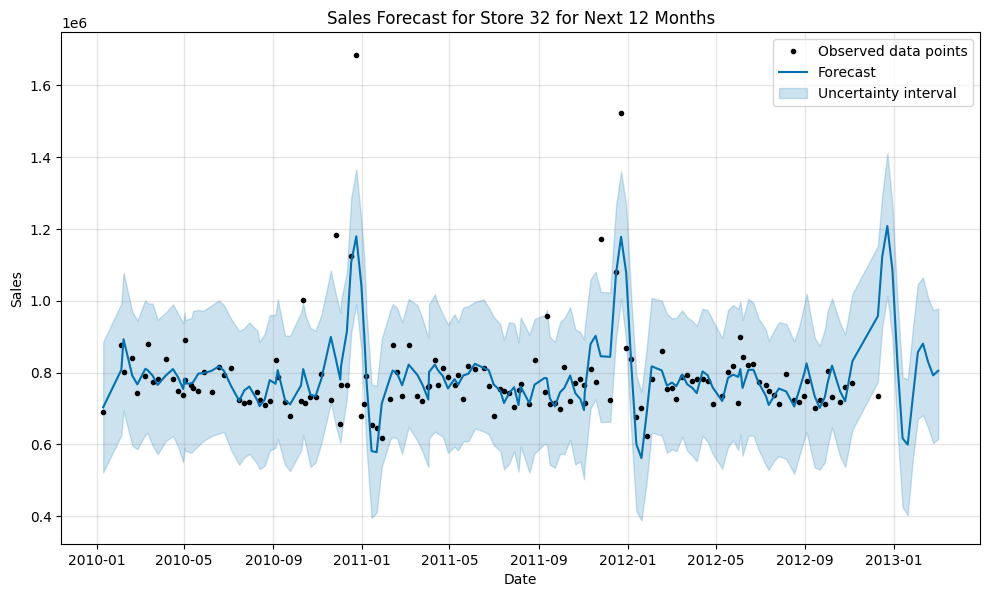

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/0oh4hy4w.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/z_nh628w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=18903', 'data', 'file=/tmp/tmptwuzpm09/0oh4hy4w.json', 'init=/tmp/tmptwuzpm09/z_nh628w.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_model0522_0f0/prophet_model-20240327055655.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:55 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:55 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


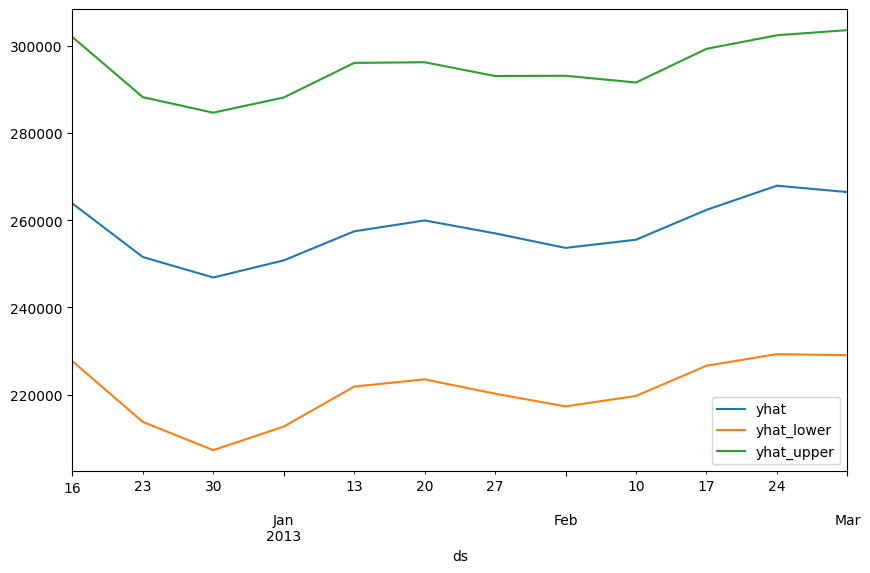

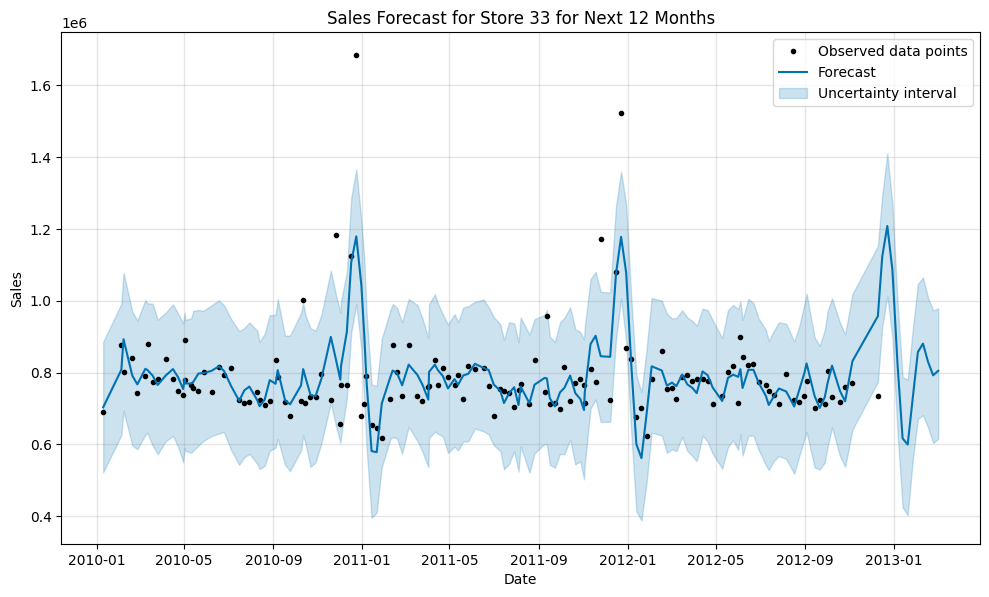

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/1gltp6er.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/kabfnld1.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=47216', 'data', 'file=/tmp/tmptwuzpm09/1gltp6er.json', 'init=/tmp/tmptwuzpm09/kabfnld1.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelyn2tssuy/prophet_model-20240327055657.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:57 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:57 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


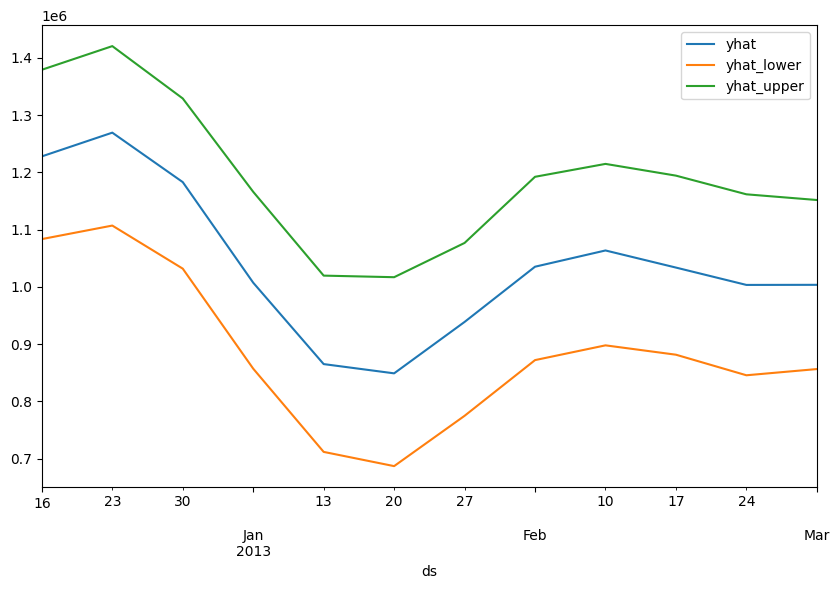

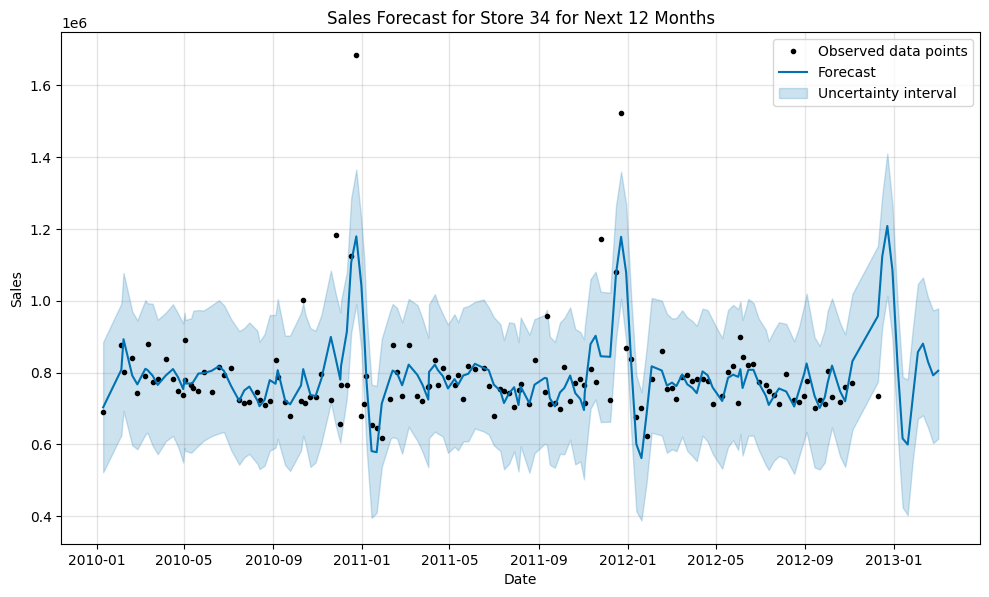

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/4rhp_9j1.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/rag41qlo.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=34356', 'data', 'file=/tmp/tmptwuzpm09/4rhp_9j1.json', 'init=/tmp/tmptwuzpm09/rag41qlo.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelr61reh2r/prophet_model-20240327055658.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:56:58 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:56:58 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


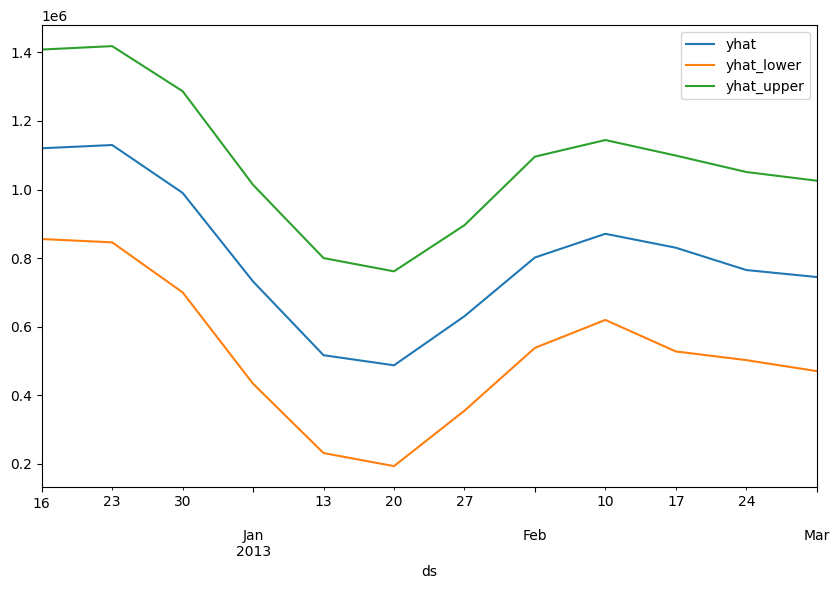

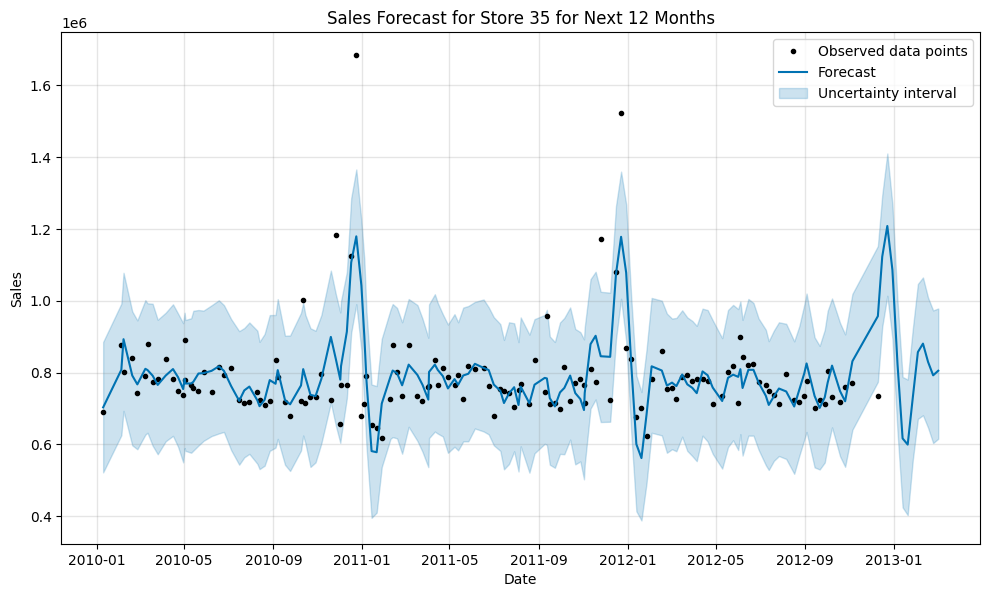

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/800rvkym.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/tfkk3ogm.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54756', 'data', 'file=/tmp/tmptwuzpm09/800rvkym.json', 'init=/tmp/tmptwuzpm09/tfkk3ogm.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelnwdk9sy7/prophet_model-20240327055700.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:57:00 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:57:00 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


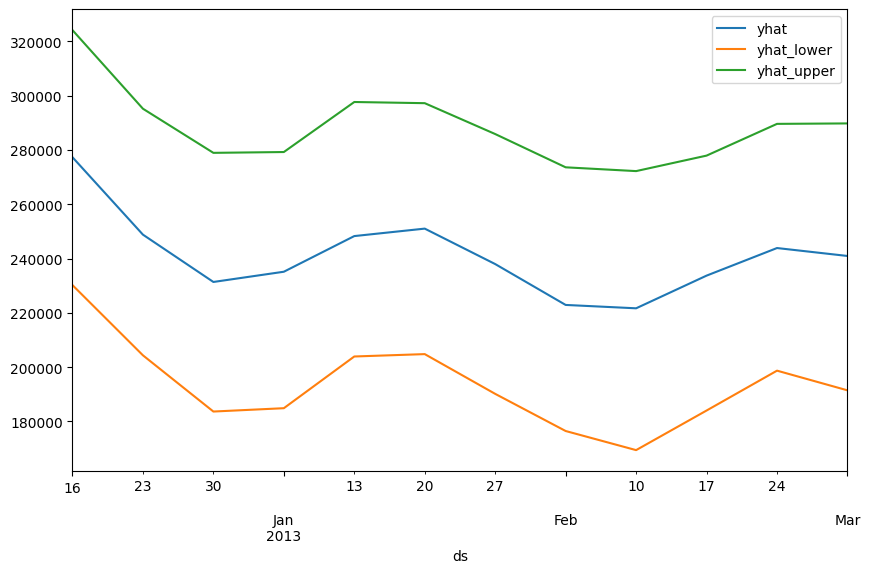

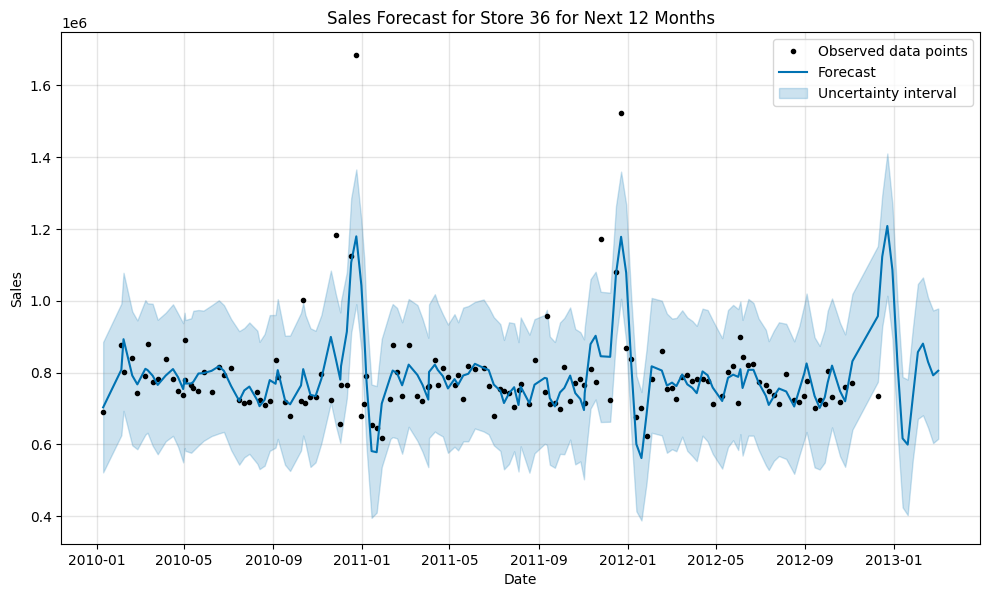

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/06c3gf52.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/z0ha3zab.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=67779', 'data', 'file=/tmp/tmptwuzpm09/06c3gf52.json', 'init=/tmp/tmptwuzpm09/z0ha3zab.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_model838tx3_a/prophet_model-20240327055701.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:57:01 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:57:01 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


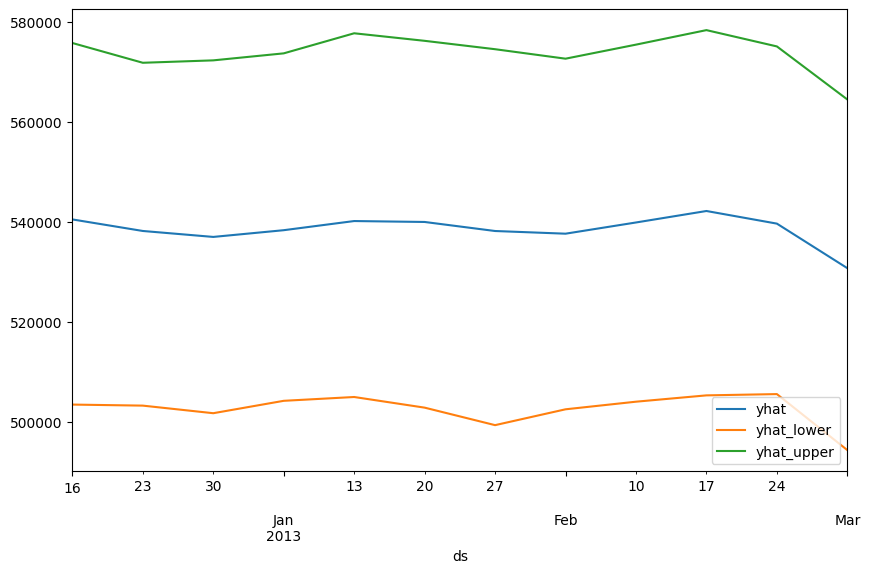

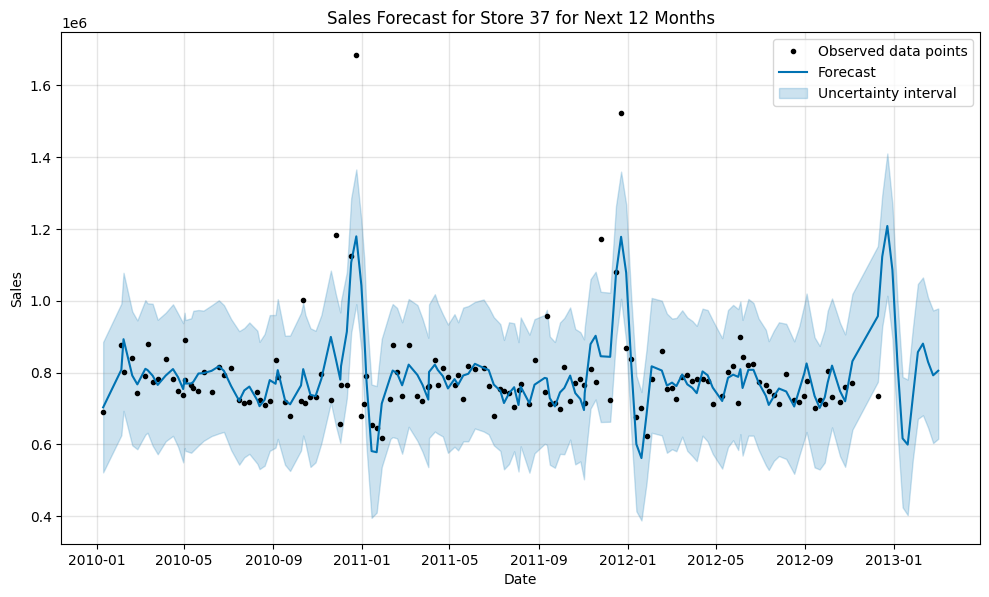

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/4cldoa4n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/czpzsmf5.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=27581', 'data', 'file=/tmp/tmptwuzpm09/4cldoa4n.json', 'init=/tmp/tmptwuzpm09/czpzsmf5.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_model3s2gds45/prophet_model-20240327055702.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:57:02 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:57:02 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


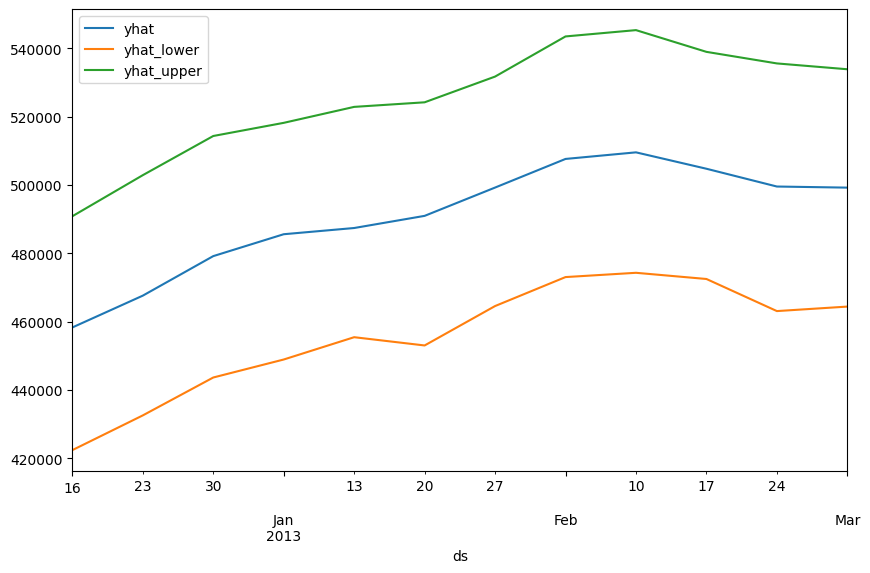

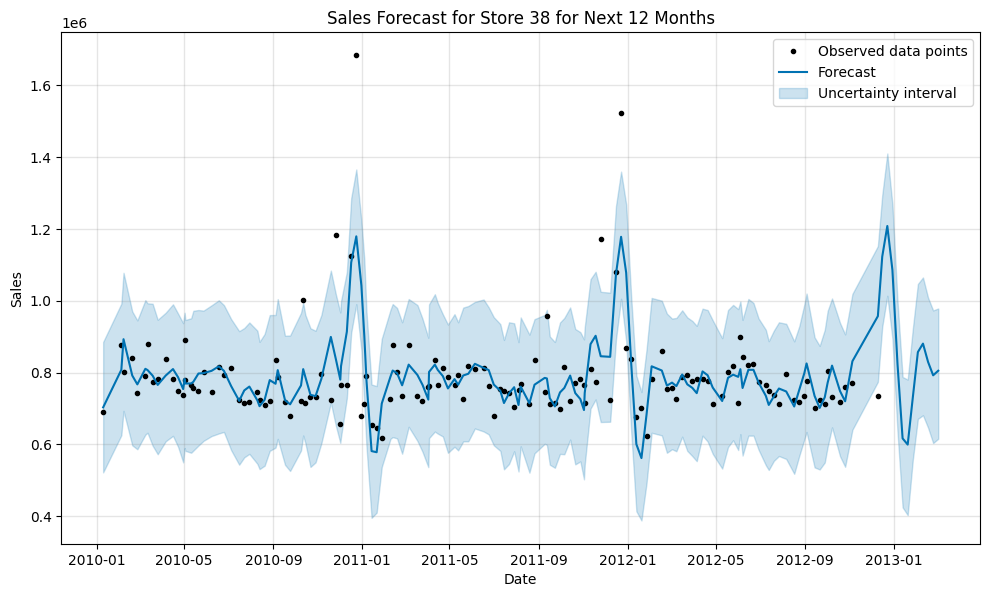

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/20lhndal.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/xyupya6d.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=54511', 'data', 'file=/tmp/tmptwuzpm09/20lhndal.json', 'init=/tmp/tmptwuzpm09/xyupya6d.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelnb4zghf3/prophet_model-20240327055704.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:57:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:57:04 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


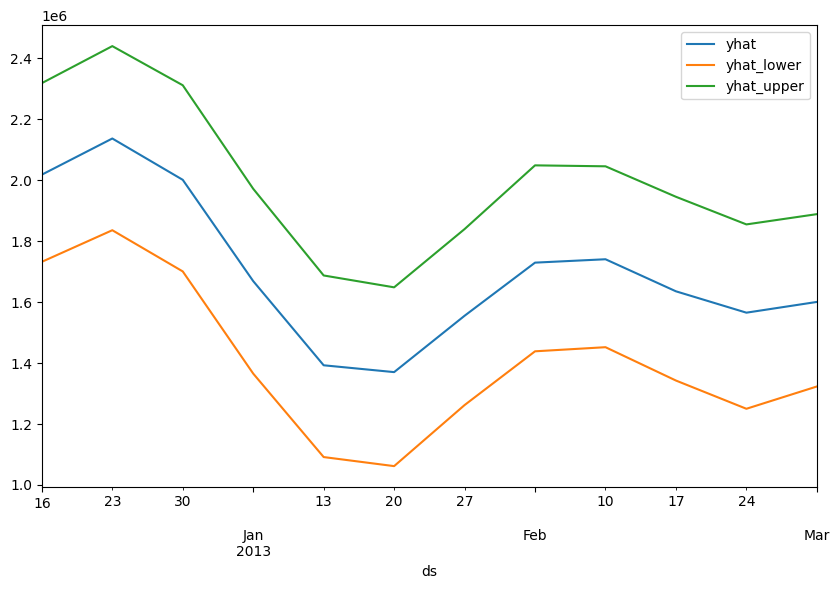

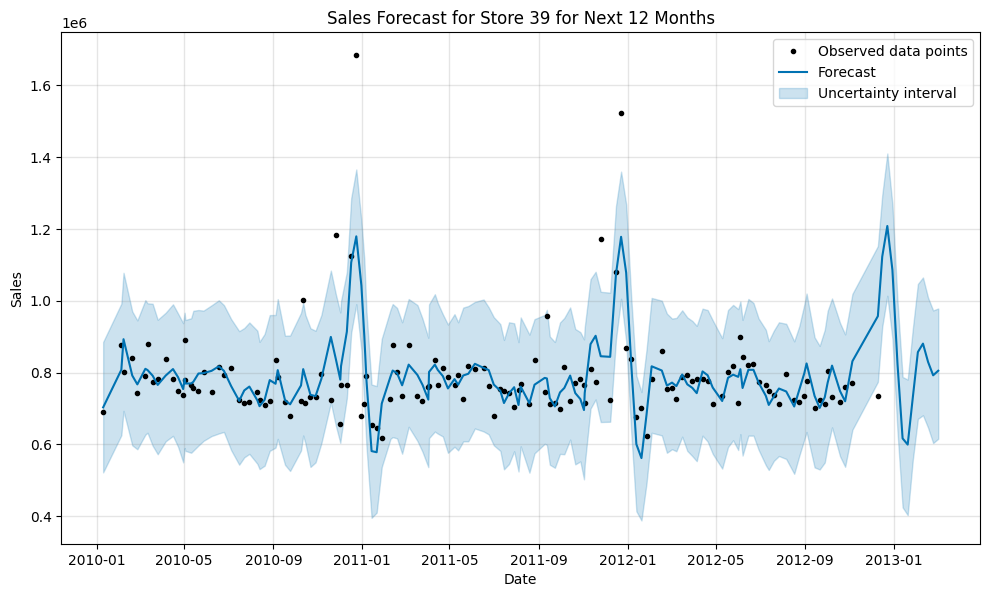

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/of748_6d.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/xq6nx736.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=42557', 'data', 'file=/tmp/tmptwuzpm09/of748_6d.json', 'init=/tmp/tmptwuzpm09/xq6nx736.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelchiifskz/prophet_model-20240327055705.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:57:05 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:57:05 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


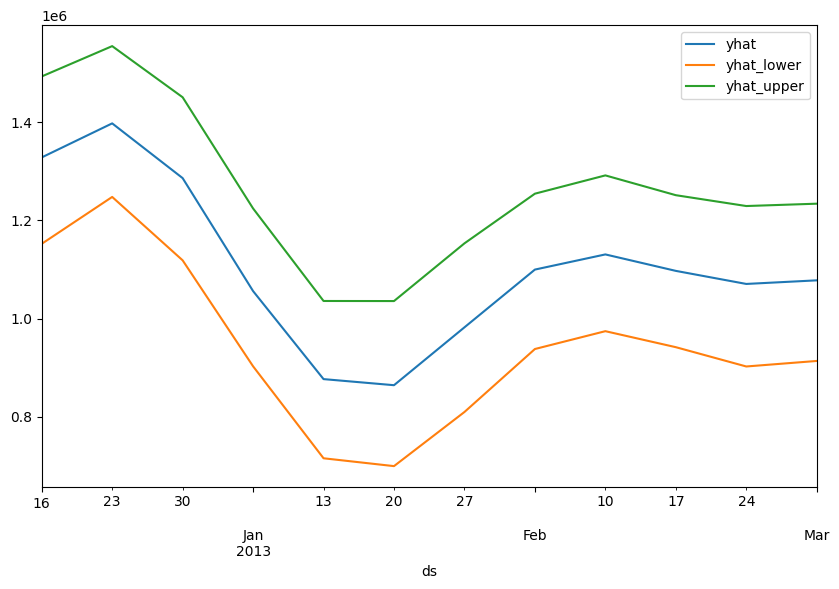

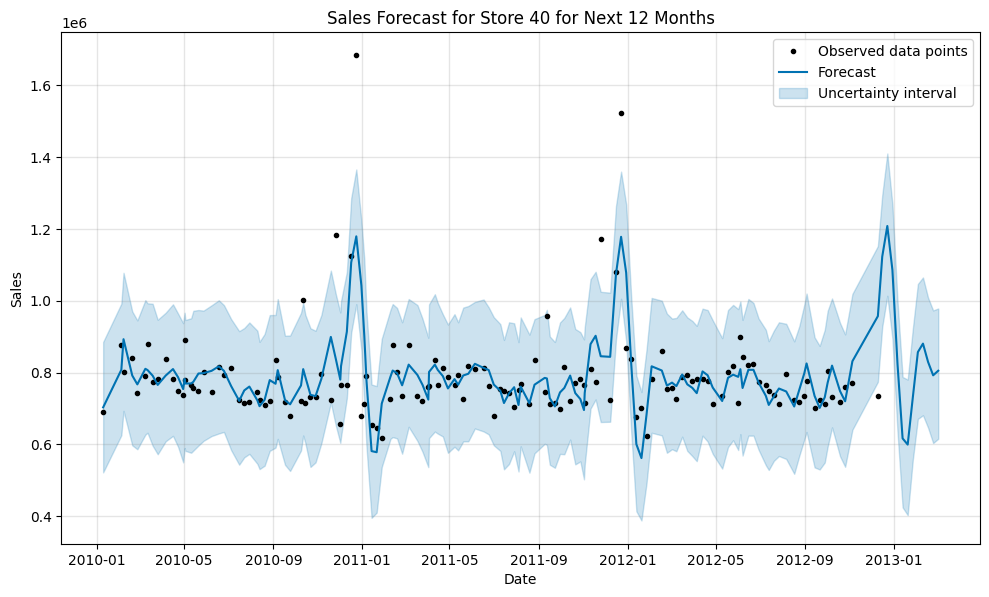

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/wwnced71.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/_snm2oxs.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=63540', 'data', 'file=/tmp/tmptwuzpm09/wwnced71.json', 'init=/tmp/tmptwuzpm09/_snm2oxs.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_model2zndw20n/prophet_model-20240327055707.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:57:07 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:57:07 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


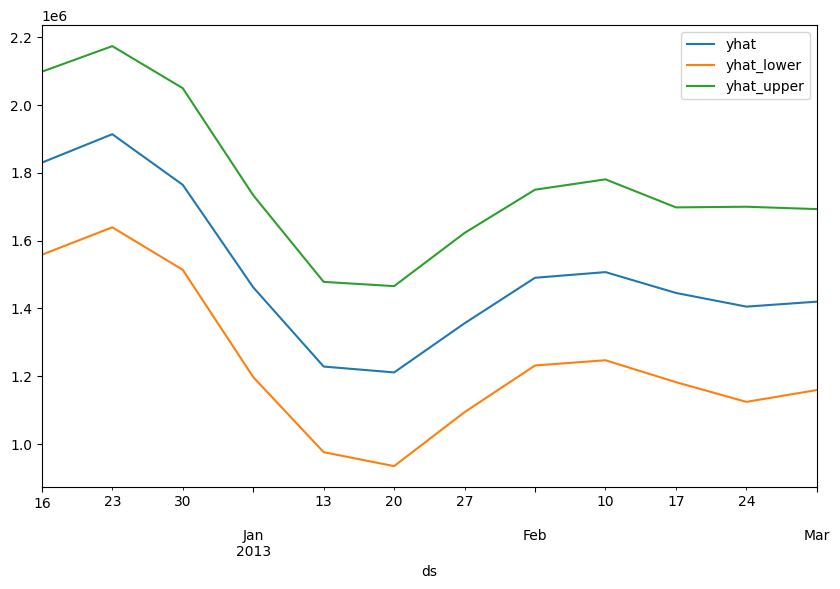

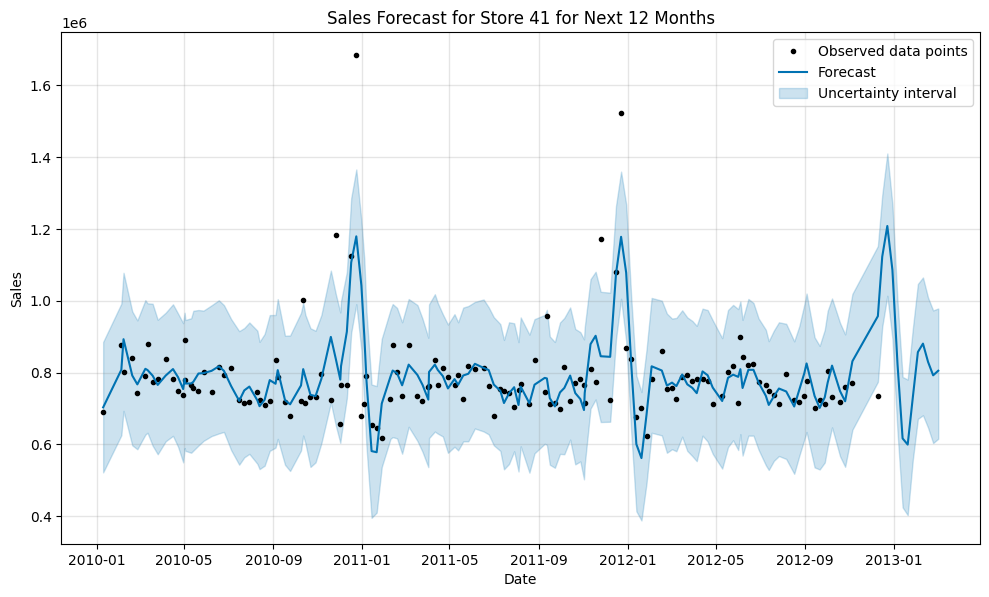

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/h4507sjo.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/h3ktbl4t.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=55192', 'data', 'file=/tmp/tmptwuzpm09/h4507sjo.json', 'init=/tmp/tmptwuzpm09/h3ktbl4t.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelh7zbedc7/prophet_model-20240327055708.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:57:08 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:57:08 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


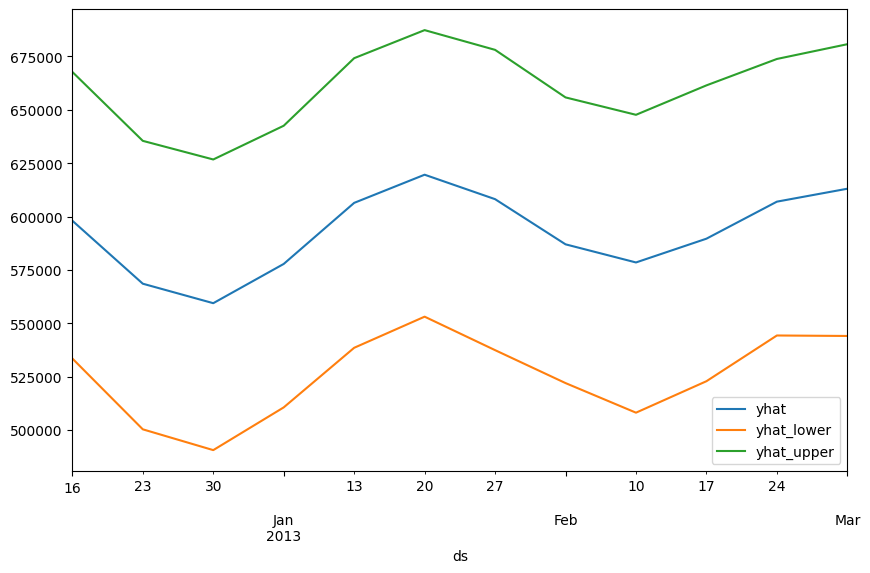

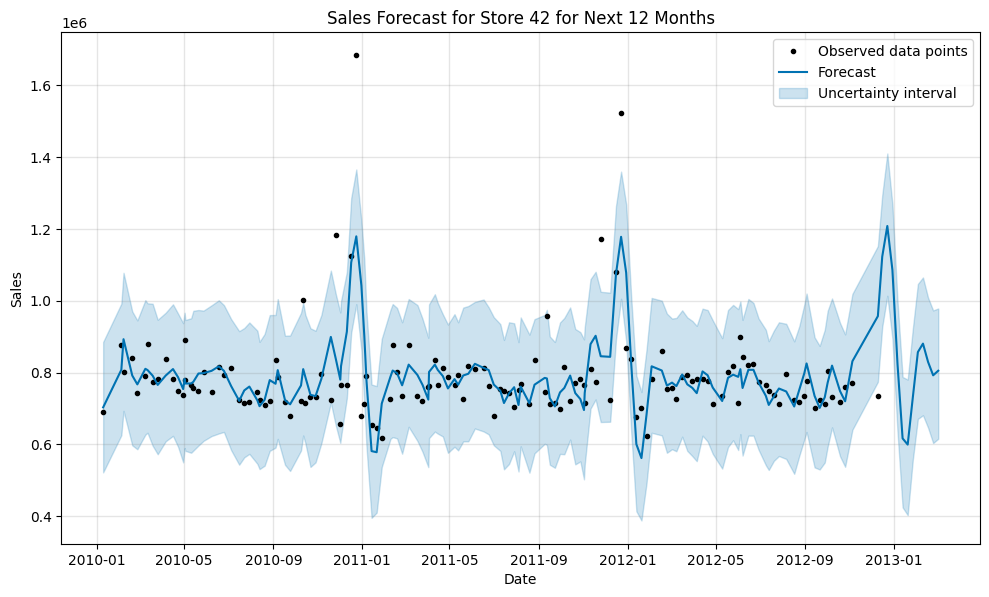

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/ad5qjwgl.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/y2fh1_da.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=35890', 'data', 'file=/tmp/tmptwuzpm09/ad5qjwgl.json', 'init=/tmp/tmptwuzpm09/y2fh1_da.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelsq9af3hw/prophet_model-20240327055709.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:57:09 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:57:09 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


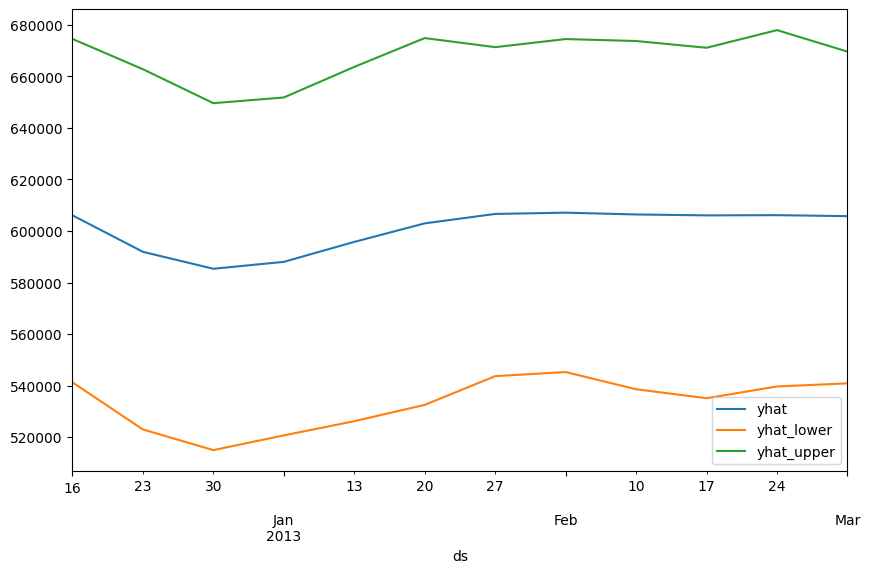

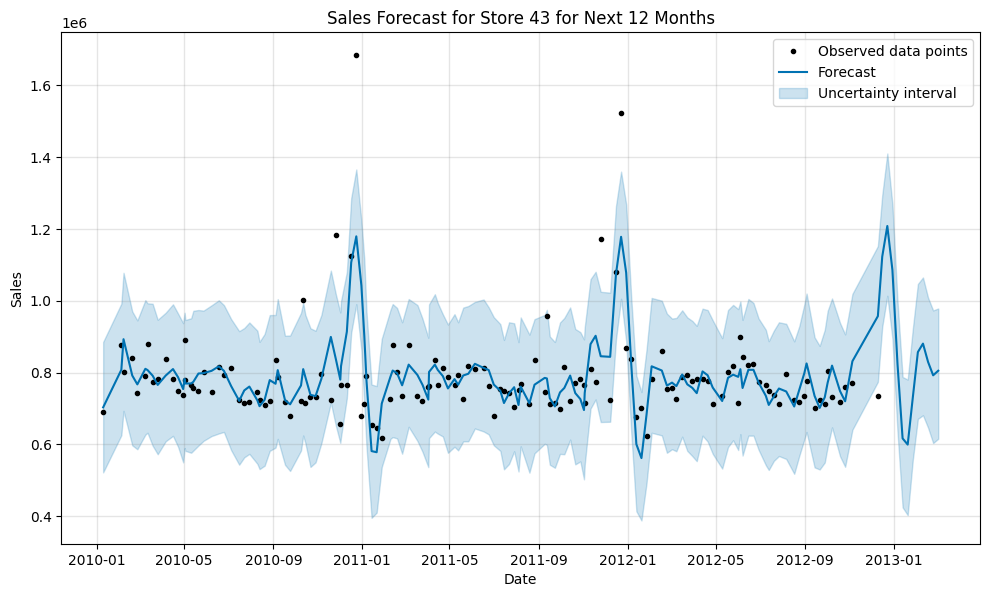

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/aq8myjft.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/ykvzdm1y.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=22278', 'data', 'file=/tmp/tmptwuzpm09/aq8myjft.json', 'init=/tmp/tmptwuzpm09/ykvzdm1y.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modellpex6td6/prophet_model-20240327055711.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:57:11 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:57:11 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


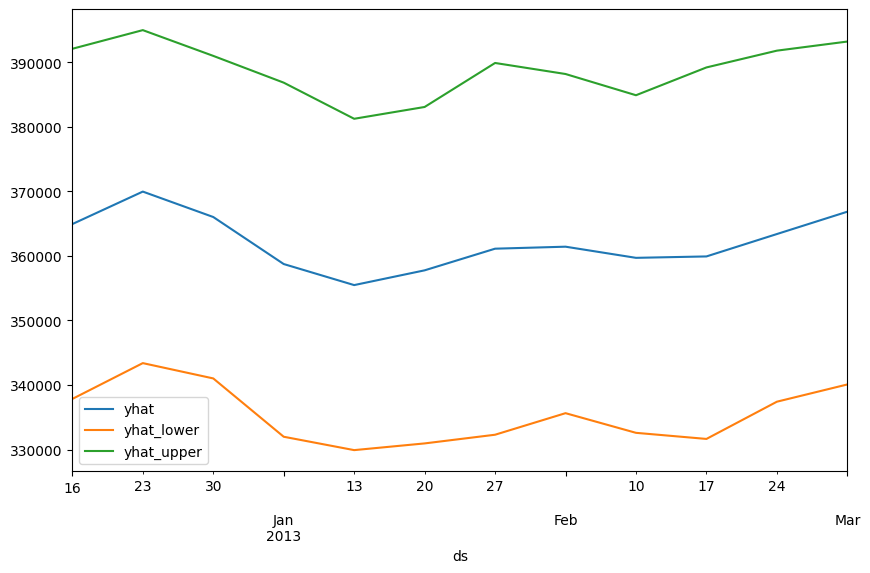

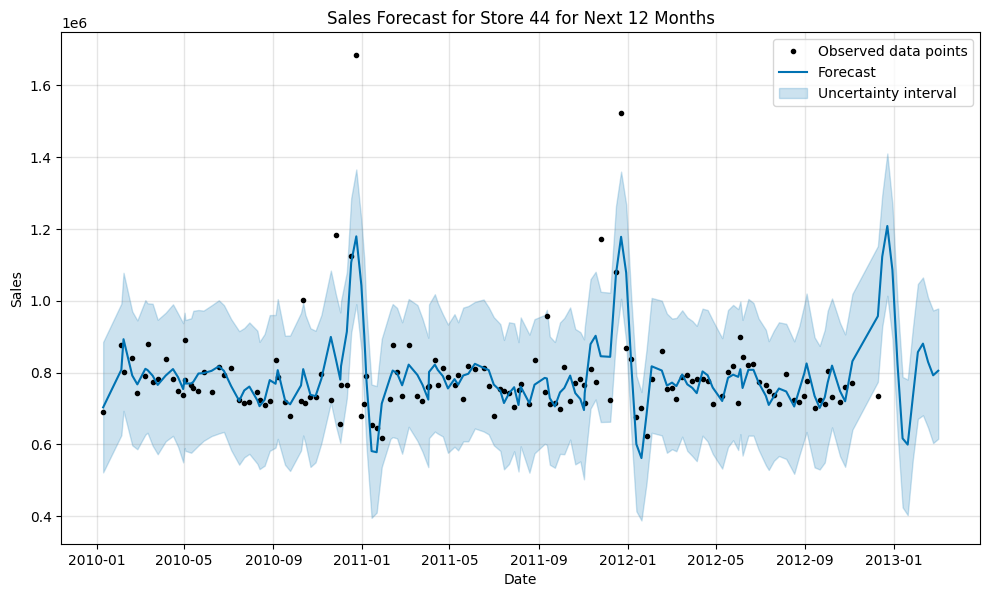

INFO:prophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/fgt1id0h.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmptwuzpm09/y1e_krbd.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.10/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=89153', 'data', 'file=/tmp/tmptwuzpm09/fgt1id0h.json', 'init=/tmp/tmptwuzpm09/y1e_krbd.json', 'output', 'file=/tmp/tmptwuzpm09/prophet_modelqd2fugqe/prophet_model-20240327055712.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
05:57:12 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
05:57:12 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


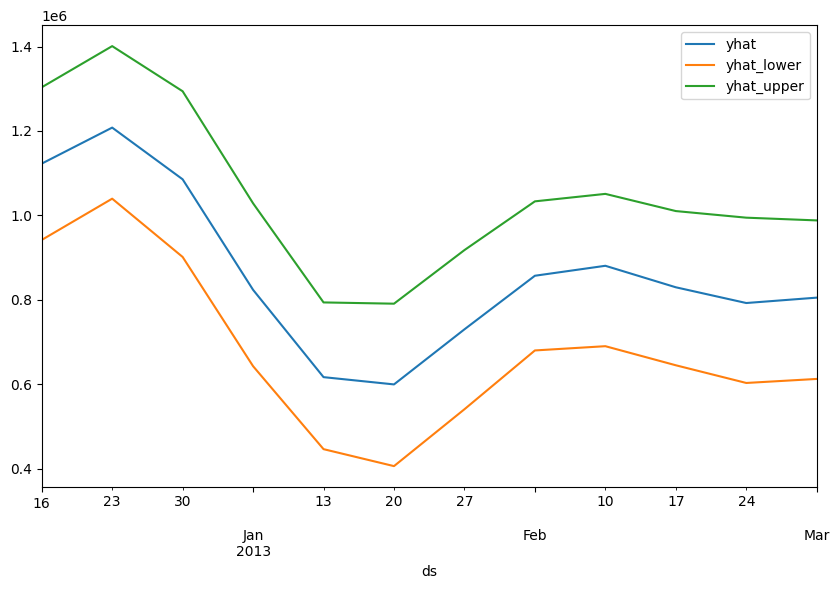

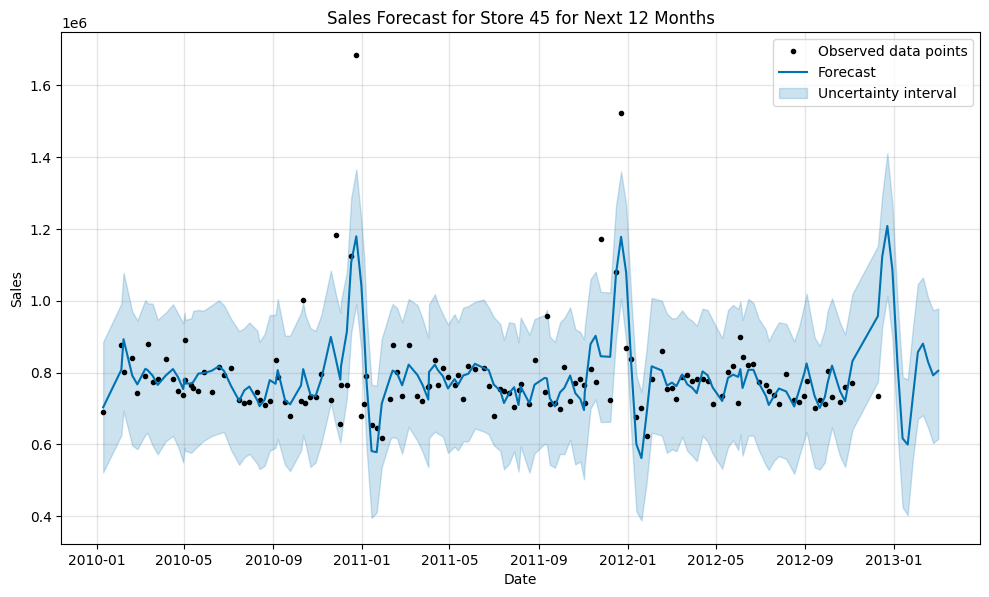

In [43]:
for store_id, store_data in walmart_df.groupby('Store'):
  # Forecast for the store
  store_forecast = forecast_store(store_data)
  # Visualization for the store
  store_data.rename(columns={'ds': 'Date', 'y': 'Weekly_Sales'}, inplace=True)
  store_forecast[['ds', 'yhat', 'yhat_lower', 'yhat_upper']].tail(12).plot(x='ds', figsize=(10, 6))
  model.plot(forecast)
  plt.xlabel('Date')
  plt.ylabel('Sales')
  plt.title(f'Sales Forecast for Store {store_id} for Next 12 Months')
  plt.legend()
  plt.grid(True)
  plt.show()